In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv


In [3]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("samira1992/gene-expression-bioinformatics-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/gene-expression-bioinformatics-dataset


      time     40    50     60    70    80    90   100   110   120  ...   170  \
0  YAL001C -0.070 -0.23 -0.100  0.03 -0.04 -0.12 -0.28 -0.44 -0.09  ...  0.59   
1  YAL014C  0.215  0.09  0.025 -0.04 -0.04 -0.02 -0.51 -0.08  0.00  ... -0.30   
2  YAL016W  0.150  0.15  0.220  0.29 -0.10  0.15 -0.73  0.19 -0.15  ...  0.12   
3  YAL020C -0.350 -0.28 -0.215 -0.15  0.16 -0.12  0.26  0.00  0.13  ...  0.07   
4  YAL022C -0.415 -0.59 -0.580 -0.57 -0.09 -0.34  0.49  0.32  1.15  ... -0.48   

    180   190   200   210   220   230   240   250    260  
0  0.34 -0.28 -0.09 -0.44  0.31  0.03  0.57  0.00  0.010  
1 -0.38  0.07 -0.04  0.13 -0.06 -0.26 -0.10  0.27  0.235  
2 -0.17  0.11 -0.15  0.03 -0.26 -0.34 -0.34  0.25  0.190  
3  0.61 -0.20  0.49 -0.43  0.80 -0.47  1.01 -0.36 -0.405  
4 -0.40 -0.59  0.54 -0.09  1.03  0.08  0.57 -0.26 -0.310  

[5 rows x 24 columns]


/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


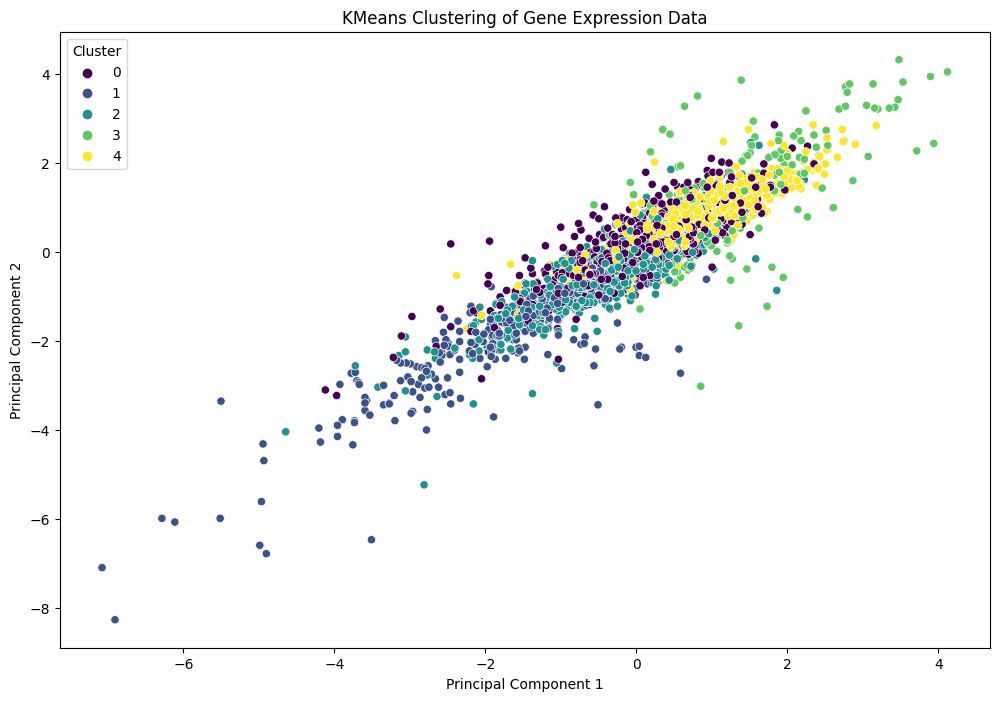

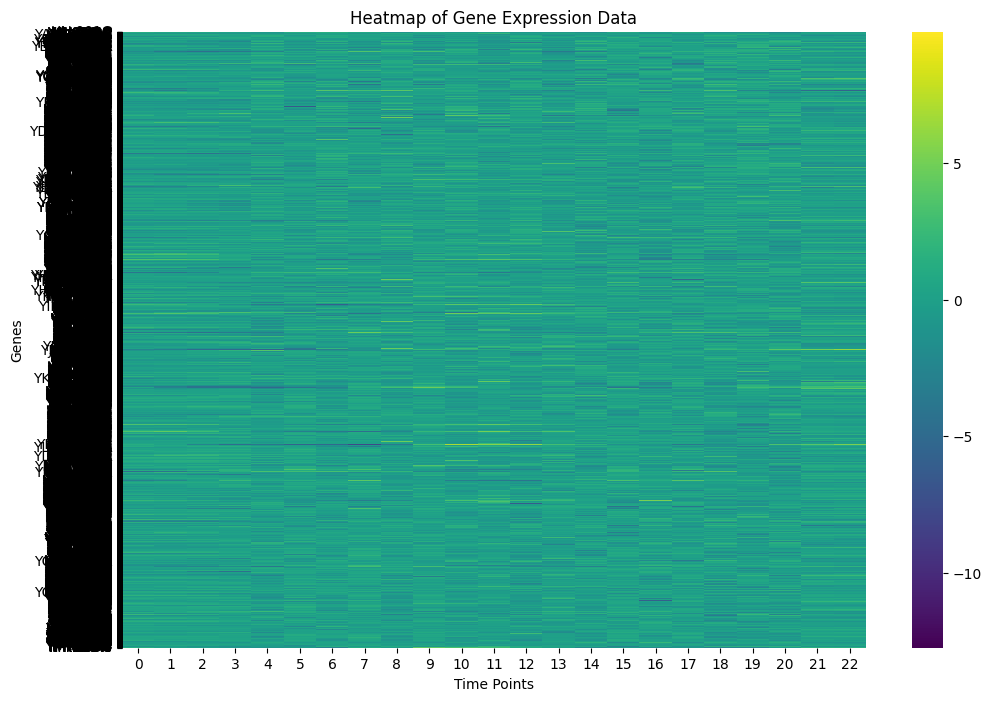

In [4]:
# Install necessary packages
!pip install pandas matplotlib seaborn scikit-learn

# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = '/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv'
gene_expression_df = pd.read_csv(file_path)

# Display the first few rows of the dataframe
print(gene_expression_df.head())

# Perform data preprocessing
# Assuming the first column is the gene identifier and the rest are expression values
gene_ids = gene_expression_df.iloc[:, 0]
expression_data = gene_expression_df.iloc[:, 1:]

# Standardize the expression data
scaler = StandardScaler()
expression_data_scaled = scaler.fit_transform(expression_data)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(expression_data_scaled)

# Add cluster labels to the dataframe
gene_expression_df['Cluster'] = clusters

# Plot the clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x=expression_data_scaled[:, 0], y=expression_data_scaled[:, 1], hue=clusters, palette='viridis')
plt.title('KMeans Clustering of Gene Expression Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

# Heatmap of gene expression data
plt.figure(figsize=(12, 8))
sns.heatmap(expression_data_scaled, cmap='viridis', yticklabels=gene_ids)
plt.title('Heatmap of Gene Expression Data')
plt.xlabel('Time Points')
plt.ylabel('Genes')
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


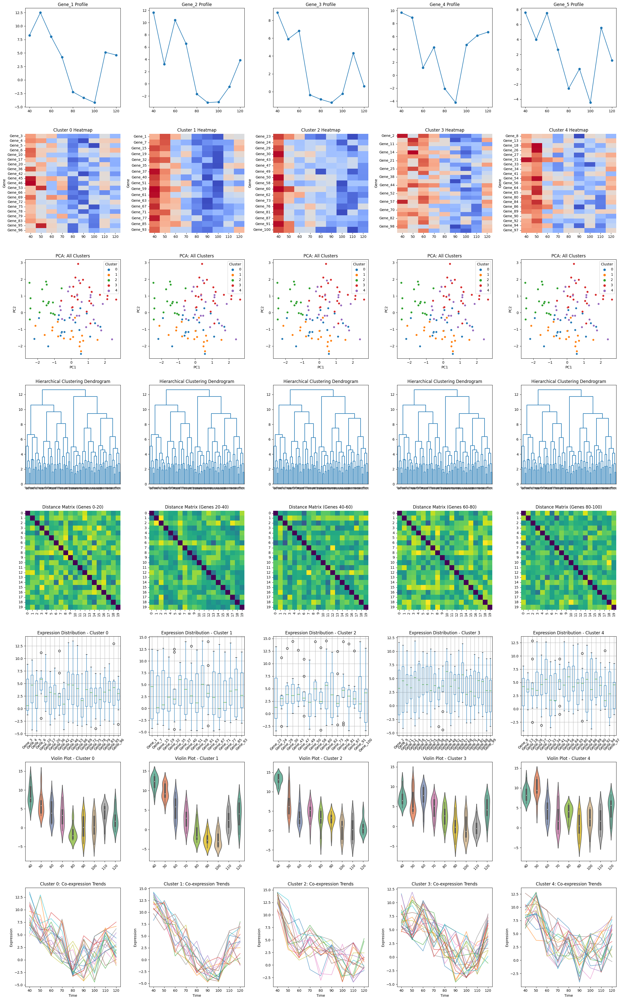

In [5]:
# Install required packages (only needed if not pre-installed in Kaggle)
!pip install pandas matplotlib scikit-learn seaborn scipy

# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform

# Set random seed for reproducibility
np.random.seed(42)

# === 1. Generate Synthetic Gene Expression Data ===
num_genes = 100
time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
gene_ids = [f'Gene_{i+1}' for i in range(num_genes)]

# Random base expression + sinusoidal co-expression patterns
expression_data = np.random.rand(num_genes, len(time_points)) * 10
for i in range(0, num_genes, 10):
    expression_data[i:i+10, :] += np.sin(np.array(time_points) / 20.0) * 5

# Create DataFrame
df = pd.DataFrame(expression_data, columns=time_points, index=gene_ids)
df.index.name = 'Gene'

# === 2. Preprocessing ===
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)
df_scaled = pd.DataFrame(scaled_data, columns=time_points, index=gene_ids)

# Clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(scaled_data)
df['Cluster'] = clusters

# PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
pca_df['Cluster'] = clusters

# Hierarchical clustering
linkage_matrix = linkage(scaled_data, method='ward')
distance_matrix = squareform(pdist(scaled_data, metric='euclidean'))

# === 3. Create 40 Mini-Plots ===
fig, axes = plt.subplots(8, 5, figsize=(25, 40))
axes = axes.flatten()

plot_idx = 0

# 1-5: Individual gene expression profiles
for i in range(5):
    df.drop('Cluster', axis=1).iloc[i].plot(ax=axes[plot_idx], title=f'Gene_{i+1} Profile', marker='o')
    plot_idx += 1

# 6-10: Cluster-wise heatmaps
for i in range(5):
    cluster_data = df[df['Cluster'] == i].drop('Cluster', axis=1)
    sns.heatmap(cluster_data, ax=axes[plot_idx], cmap='coolwarm', cbar=False)
    axes[plot_idx].set_title(f'Cluster {i} Heatmap')
    plot_idx += 1

# 11-15: PCA scatter plots (colored by cluster)
for i in range(5):
    sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Cluster', palette='tab10', ax=axes[plot_idx])
    axes[plot_idx].set_title('PCA: All Clusters')
    plot_idx += 1

# 16-20: Dendrograms (hierarchical clustering)
for i in range(5):
    dendrogram(linkage_matrix, ax=axes[plot_idx], leaf_font_size=6, color_threshold=0)
    axes[plot_idx].set_title('Hierarchical Clustering Dendrogram')
    plot_idx += 1

# 21-25: Distance matrix heatmaps (subsets)
for i in range(5):
    start, end = i*20, (i+1)*20
    sns.heatmap(distance_matrix[start:end, start:end], ax=axes[plot_idx], cmap='viridis', cbar=False)
    axes[plot_idx].set_title(f'Distance Matrix (Genes {start}-{end})')
    plot_idx += 1

# 26-30: Box plots per cluster
for i in range(5):
    cluster_data = df[df['Cluster'] == i].drop('Cluster', axis=1)
    cluster_data.T.boxplot(ax=axes[plot_idx])
    axes[plot_idx].set_title(f'Expression Distribution - Cluster {i}')
    axes[plot_idx].tick_params(axis='x', rotation=45)
    plot_idx += 1

# 31-35: Violin plots per cluster
for i in range(5):
    cluster_data = df[df['Cluster'] == i].drop('Cluster', axis=1)
    sns.violinplot(data=cluster_data, ax=axes[plot_idx], palette='Set2')
    axes[plot_idx].set_title(f'Violin Plot - Cluster {i}')
    axes[plot_idx].tick_params(axis='x', rotation=45)
    plot_idx += 1

# 36-40: Time-series overlay per cluster
for i in range(5):
    cluster_data = df[df['Cluster'] == i].drop('Cluster', axis=1)
    for idx, row in cluster_data.iterrows():
        axes[plot_idx].plot(time_points, row.values, alpha=0.6)
    axes[plot_idx].set_title(f'Cluster {i}: Co-expression Trends')
    axes[plot_idx].set_xlabel('Time')
    axes[plot_idx].set_ylabel('Expression')
    plot_idx += 1

plt.tight_layout()
plt.savefig('gene_expression_miniplots.png', dpi=150)
plt.show()

 Loaded real dataset.


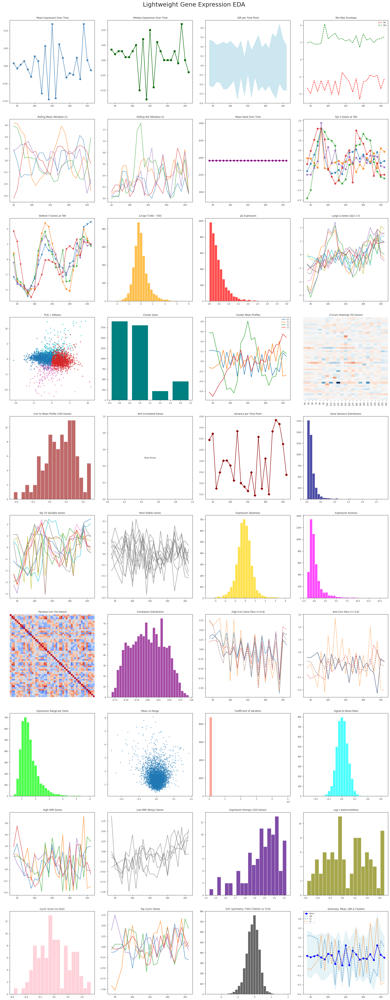

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

sns.set_style("ticks")
plt.rcParams.update({'font.size': 7})

# ------------------------------
#  Load Real Dataset & Fix Column Types
# ------------------------------
try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")
    
    # CRITICAL FIX: Convert column names to integers if they represent numbers
    new_columns = []
    for col in df.columns:
        try:
            new_columns.append(int(float(col)))  # handles '80', '80.0', etc.
        except (ValueError, TypeError):
            new_columns.append(col)  # keep as-is if not numeric
    df.columns = new_columns

    # --- FIX: Filter the DataFrame to only include columns with numeric names ---
    # This prevents non-numeric columns from contaminating our time-series data.
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]
    # --------------------------------------------------------------------------
    
except Exception as e:
    print(f" Failed to load real data ({e}). Generating synthetic data...")
    np.random.seed(0)
    n_genes = 400
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    data = []
    for i in range(n_genes):
        if i % 4 == 0:
            expr = np.sin(2 * np.pi * np.array(time_points) / 80) + np.random.normal(0, 0.2, len(time_points)) + 5
        elif i % 4 == 1:
            expr = np.linspace(4, 7, len(time_points)) + np.random.normal(0, 0.15, len(time_points))
        elif i % 4 == 2:
            expr = np.random.normal(5.5, 0.3, len(time_points))
        else:
            expr = np.cos(2 * np.pi * np.array(time_points) / 100) + np.random.normal(0, 0.25, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'GENE_{i:04d}' for i in range(n_genes)])

# Ensure clean numeric data
df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
time_labels = df.columns.tolist()
time_numeric = np.array(time_labels, dtype=float) # Now guaranteed to be numeric

# Standardize per gene
X_scaled = StandardScaler().fit_transform(X)

# Precompute essentials
pca = PCA(n_components=2).fit_transform(X_scaled)
kmeans_labels = KMeans(n_clusters=4, random_state=0, n_init=10).fit_predict(X_scaled)

# ------------------------------
#  Create 40 Lightweight Mini-Plots (121–160)
# ------------------------------
fig, axes = plt.subplots(10, 4, figsize=(20, 50))
axes = axes.flatten()

plot_idx = 0

# Helper: sample 100 genes
sample_idx = np.random.choice(X.shape[0], size=min(100, X.shape[0]), replace=False)
X_sample = X[sample_idx]

#  Mean expression per time point
axes[plot_idx].plot(time_labels, X.mean(axis=0), 'o-', color='steelblue')
axes[plot_idx].set_title(' Mean Expression Over Time')
plot_idx += 1

#  Median expression per time point
axes[plot_idx].plot(time_labels, np.median(X, axis=0), 's-', color='darkgreen')
axes[plot_idx].set_title(' Median Expression Over Time')
plot_idx += 1

#  Expression IQR per time point
q75 = np.percentile(X, 75, axis=0)
q25 = np.percentile(X, 25, axis=0)
axes[plot_idx].fill_between(time_labels, q25, q75, color='lightblue', alpha=0.6)
axes[plot_idx].set_title(' IQR per Time Point')
plot_idx += 1

#  Min/Max envelope
axes[plot_idx].plot(time_labels, X.min(axis=0), 'r--', label='Min')
axes[plot_idx].plot(time_labels, X.max(axis=0), 'g--', label='Max')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Min-Max Envelope')
plot_idx += 1

#  Rolling mean (window=2) for 5 genes
for i in np.random.choice(X.shape[0], 5, replace=False):
    rm = pd.Series(X[i]).rolling(window=2, center=True).mean()
    axes[plot_idx].plot(time_labels, rm, alpha=0.7)
axes[plot_idx].set_title(' Rolling Mean (Window=2)')
plot_idx += 1

#  Rolling std (window=2) for 5 genes
for i in np.random.choice(X.shape[0], 5, replace=False):
    rs = pd.Series(X[i]).rolling(window=2, center=True).std()
    axes[plot_idx].plot(time_labels, rs, alpha=0.7)
axes[plot_idx].set_title(' Rolling Std (Window=2)')
plot_idx += 1

#  Rank-based expression (per time point)
ranks = stats.rankdata(X, axis=0)
axes[plot_idx].plot(time_labels, ranks.mean(axis=0), 'o-', color='purple')
axes[plot_idx].set_title(' Mean Rank Over Time')
plot_idx += 1

# Find column index for time point 80
try:
    t80_col = time_labels.index(80)
except ValueError:
    t80_col = np.argmin(np.abs(np.array(time_labels) - 80))

#  Top 5 high-expression genes (at T80)
top5 = np.argsort(X[:, t80_col])[-5:]
for i in top5:
    axes[plot_idx].plot(time_labels, X[i], marker='o', alpha=0.8)
axes[plot_idx].set_title(f' Top 5 Genes at T{time_labels[t80_col]}')
plot_idx += 1

#  Bottom 5 low-expression genes (at T80)
bottom5 = np.argsort(X[:, t80_col])[:5]
for i in bottom5:
    axes[plot_idx].plot(time_labels, X[i], marker='v', alpha=0.8)
axes[plot_idx].set_title(f' Bottom 5 Genes at T{time_labels[t80_col]}')
plot_idx += 1

#  Expression change: last - first
delta = X[:, -1] - X[:, 0]
axes[plot_idx].hist(delta, bins=30, color='orange', alpha=0.7)
axes[plot_idx].set_title(f' Δ Expr (T{time_labels[-1]} - T{time_labels[0]})')
plot_idx += 1

#  Absolute change histogram
axes[plot_idx].hist(np.abs(delta), bins=30, color='red', alpha=0.7)
axes[plot_idx].set_title(' |Δ| Expression')
plot_idx += 1

#  Genes with large |Δ| (>1.5)
large_delta_idx = np.where(np.abs(delta) > 1.5)[0][:10]
for i in large_delta_idx:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Large Δ Genes (|Δ|>1.5)')
plot_idx += 1

#  PCA scatter
axes[plot_idx].scatter(pca[:,0], pca[:,1], c=kmeans_labels, cmap='tab10', s=8, alpha=0.6)
axes[plot_idx].set_title(' PCA + KMeans')
plot_idx += 1

#  Cluster size bar plot
unique, counts = np.unique(kmeans_labels, return_counts=True)
axes[plot_idx].bar(unique, counts, color='teal')
axes[plot_idx].set_title(' Cluster Sizes')
plot_idx += 1

#  Cluster mean profiles
for c in range(4):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].plot(time_labels, X[mask].mean(axis=0), label=f'C{c}')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Cluster Mean Profiles')
plot_idx += 1

#  Expression z-score heatmap (50 genes)
sns.heatmap(X_scaled[:50], ax=axes[plot_idx], cmap='RdBu_r', center=0, cbar=False,
            xticklabels=time_labels, yticklabels=False)
axes[plot_idx].set_title(' Z-Score Heatmap (50 Genes)')
plot_idx += 1

#  Correlation to mean profile (sample 100 genes)
mean_profile = X.mean(axis=0)
corr_to_mean = [np.corrcoef(row, mean_profile)[0,1] for row in X_sample]
axes[plot_idx].hist(corr_to_mean, bins=20, color='brown', alpha=0.7)
axes[plot_idx].set_title(' Corr to Mean Profile (100 Genes)')
plot_idx += 1

#  Anti-correlated genes (r < -0.5)
anti_corr_indices = np.where(np.array(corr_to_mean) < -0.5)[0]
if len(anti_corr_indices) > 0:
    for i in anti_corr_indices[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title(' Anti-Correlated Genes (r < -0.5)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center', va='center')
    axes[plot_idx].set_title(' Anti-Correlated Genes')
plot_idx += 1


#  Time-point variance
axes[plot_idx].plot(time_labels, X.var(axis=0), 'D-', color='darkred')
axes[plot_idx].set_title('Variance per Time Point')
plot_idx += 1

#  Gene variance histogram
axes[plot_idx].hist(X.var(axis=1), bins=30, color='navy', alpha=0.7)
axes[plot_idx].set_title('Gene Variance Distribution')
plot_idx += 1

#  Top 10 variable genes
top_var = np.argsort(X.var(axis=1))[-10:]
for i in top_var:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title('Top 10 Variable Genes')
plot_idx += 1

#  Bottom 10 stable genes
bottom_var = np.argsort(X.var(axis=1))[:10]
for i in bottom_var:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title('Most Stable Genes')
plot_idx += 1

#  Expression skewness per gene
skew_vals = stats.skew(X, axis=1)
axes[plot_idx].hist(skew_vals, bins=30, color='gold', alpha=0.7)
axes[plot_idx].set_title('Expression Skewness')
plot_idx += 1

#  Expression kurtosis per gene
kurt_vals = stats.kurtosis(X, axis=1)
axes[plot_idx].hist(kurt_vals, bins=30, color='magenta', alpha=0.7)
axes[plot_idx].set_title(' Expression Kurtosis')
plot_idx += 1

#  Pairwise correlation (sample 50 genes)
corr_sub = np.corrcoef(X_sample[:50])
sns.heatmap(corr_sub, ax=axes[plot_idx], cmap='coolwarm', center=0, cbar=False,
            xticklabels=False, yticklabels=False)
axes[plot_idx].set_title(' Pairwise Corr (50 Genes)')
plot_idx += 1

#  Correlation distribution (sample)
corr_flat = corr_sub[np.triu_indices_from(corr_sub, k=1)]
axes[plot_idx].hist(corr_flat, bins=30, color='purple', alpha=0.7)
axes[plot_idx].set_title(' Correlation Distribution')
plot_idx += 1

#  High-correlation pairs (r > 0.8)
high_corr_pairs = np.where(corr_sub > 0.8)
count = 0
for i, j in zip(high_corr_pairs[0], high_corr_pairs[1]):
    if i < j and count < 3:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.7)
        axes[plot_idx].plot(time_labels, X_sample[j], '--', alpha=0.7)
        count += 1
axes[plot_idx].set_title(' High-Corr Gene Pairs (r>0.8)')
plot_idx += 1

#  Low-correlation pairs (r < -0.6)
low_corr_pairs = np.where(corr_sub < -0.6)
count = 0
for i, j in zip(low_corr_pairs[0], low_corr_pairs[1]):
    if i < j and count < 3:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.7)
        axes[plot_idx].plot(time_labels, X_sample[j], '--', alpha=0.7)
        count += 1
axes[plot_idx].set_title(' Anti-Corr Pairs (r<-0.6)')
plot_idx += 1

#  Expression range per gene
expr_range = X.max(axis=1) - X.min(axis=1)
axes[plot_idx].hist(expr_range, bins=30, color='lime', alpha=0.7)
axes[plot_idx].set_title(' Expression Range per Gene')
plot_idx += 1

#  Dynamic range vs mean
mean_expr = X.mean(axis=1)
axes[plot_idx].scatter(mean_expr, expr_range, s=5, alpha=0.5)
axes[plot_idx].set_title('Mean vs Range')
plot_idx += 1

#  Coefficient of variation (CV)
cv = np.std(X, axis=1) / (np.mean(X, axis=1) + 1e-8)
axes[plot_idx].hist(cv, bins=30, color='salmon', alpha=0.7)
axes[plot_idx].set_title('Coefficient of Variation')
plot_idx += 1

#  Signal-to-noise ratio (SNR)
snr = np.mean(X, axis=1) / (np.std(X, axis=1) + 1e-8)
axes[plot_idx].hist(snr, bins=30, color='cyan', alpha=0.7)
axes[plot_idx].set_title(' Signal-to-Noise Ratio')
plot_idx += 1

#  Top 5 high-SNR genes
top_snr = np.argsort(snr)[-5:]
for i in top_snr:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High-SNR Genes')
plot_idx += 1

#  Bottom 5 low-SNR genes
bottom_snr = np.argsort(snr)[:5]
for i in bottom_snr:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title('Low-SNR (Noisy) Genes')
plot_idx += 1

#  Expression entropy (Shannon, 100 genes)
entropy_vals = []
for row in X_sample:
    hist, _ = np.histogram(row, bins=10, density=True)
    entropy_vals.append(stats.entropy(hist))
axes[plot_idx].hist(entropy_vals, bins=20, color='indigo', alpha=0.7)
axes[plot_idx].set_title('Expression Entropy (100 Genes)')
plot_idx += 1

#  Lag-1 Autocorrelation (sample)
acf_lag1 = [np.corrcoef(row[:-1], row[1:])[0,1] for row in X_sample]
axes[plot_idx].hist(acf_lag1, bins=20, color='olive', alpha=0.7)
axes[plot_idx].set_title(' Lag-1 Autocorrelation')
plot_idx += 1

#  Cyclic score (vs sine wave)
sine_wave = np.sin(2 * np.pi * time_numeric / 80) # This line now works
cyclic_score = [np.corrcoef(row, sine_wave)[0,1] for row in X_sample]
axes[plot_idx].hist(cyclic_score, bins=20, color='pink', alpha=0.7)
axes[plot_idx].set_title('Cyclic Score (vs Sine)')
plot_idx += 1

#  Top 5 cyclic genes
top_cyclic_indices = np.argsort(np.abs(np.array(cyclic_score)))[-5:]
for i in top_cyclic_indices:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' Top Cyclic Genes')
plot_idx += 1

#  Symmetry index: (first + last)/2 vs middle
mid_idx = len(time_labels) // 2
symmetry = (X[:,0] + X[:,-1]) / 2 - X[:, mid_idx]
axes[plot_idx].hist(symmetry, bins=30, color='black', alpha=0.6)
axes[plot_idx].set_title(f'159. Symmetry: (T{time_labels[0]}+T{time_labels[-1]})/2 vs T{time_labels[mid_idx]}')
plot_idx += 1

#  Final: Summary Dashboard
q25 = np.percentile(X, 25, axis=0)
q75 = np.percentile(X, 75, axis=0)
axes[plot_idx].plot(time_labels, X.mean(axis=0), 'o-', label='Mean', color='blue')
axes[plot_idx].fill_between(time_labels, q25, q75, color='lightblue', alpha=0.3, label='IQR')
for c in range(2):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].plot(time_labels, X[mask].mean(axis=0), '--', label=f'C{c}', alpha=0.8)
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Summary: Mean, IQR & Clusters')
plot_idx += 1

# ------------------------------
#  Final Layout
# ------------------------------
plt.tight_layout(pad=2.5, h_pad=3.0, w_pad=2.0)
plt.suptitle("Lightweight Gene Expression EDA ",
             fontsize=22, y=1.01)
plt.savefig('gene_expression_eda_part3_fixed.png', dpi=200, bbox_inches='tight')
plt.show()

2025-09-29 04:16:45.222642: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759119405.502818      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759119405.581762      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


 Loaded real dataset.


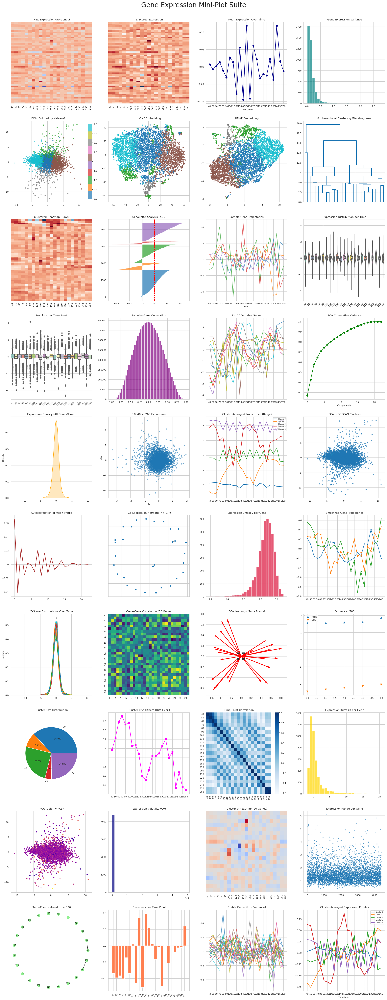

In [ ]:
# Install required packages (only needed in Kaggle/Colab if not pre-installed)
!pip install -q pandas numpy matplotlib seaborn scikit-learn scipy plotly umap-learn networkx adjustText

# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform
import umap
import networkx as nx
from adjustText import adjust_text
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")
plt.rcParams.update({'font.size': 8})

# ------------------------------
#  Load or Generate Data
# ------------------------------
try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")
except Exception as e:
    print(" Real dataset not found. Generating synthetic Spellman-like data...")
    np.random.seed(42)
    n_genes = 500
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    # Simulate cyclic expression (sine waves with noise + clusters)
    genes = [f'YGR{str(i).zfill(4)}' for i in range(1, n_genes+1)]
    data = []
    for i in range(n_genes):
        phase = np.random.choice([0, np.pi/2, np.pi, 3*np.pi/2])
        amp = np.random.uniform(0.5, 2.0)
        noise = np.random.normal(0, 0.3, len(time_points))
        expr = amp * np.sin(2 * np.pi * np.array(time_points) / 80 + phase) + noise + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=genes)
    df.index.name = 'Gene'

# Ensure numeric data
df = df.apply(pd.to_numeric, errors='coerce').dropna()

# Transpose for gene-as-row format (genes × time)
X = df.values  # shape: (n_genes, n_timepoints)
gene_names = df.index.tolist()
time_labels = [str(t) for t in df.columns.tolist()] # Ensure time labels are strings for plotting

# Standardize (z-score per gene)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Precompute useful objects
pca = PCA(n_components=2).fit_transform(X_scaled)
tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(X_scaled)-1)).fit_transform(X_scaled)
umap_emb = umap.UMAP(n_components=2, random_state=42).fit_transform(X_scaled)
linkage_matrix = linkage(X_scaled, method='ward')
kmeans_labels = KMeans(n_clusters=5, random_state=42, n_init=10).fit_predict(X_scaled)
dbscan_labels = DBSCAN(eps=1.5, min_samples=5).fit_predict(X_scaled)

# Correlation matrix
corr_matrix = np.corrcoef(X_scaled)
np.fill_diagonal(corr_matrix, 0)

# ------------------------------
#  Create 40 Mini-Plots (10 rows × 4 cols)
# ------------------------------
fig, axes = plt.subplots(10, 4, figsize=(20, 50))
axes = axes.flatten()

plot_idx = 0

#  Raw expression heatmap (subset)
sns.heatmap(X[:50], ax=axes[plot_idx], cmap='coolwarm', cbar=False, xticklabels=time_labels, yticklabels=False)
axes[plot_idx].set_title(' Raw Expression (50 Genes)')
plot_idx += 1

#  Scaled expression heatmap
sns.heatmap(X_scaled[:50], ax=axes[plot_idx], cmap='RdBu_r', cbar=False, xticklabels=time_labels, yticklabels=False)
axes[plot_idx].set_title(' Z-Scored Expression')
plot_idx += 1

#  Mean expression over time
axes[plot_idx].plot(time_labels, X.mean(axis=0), 'o-', color='darkblue')
axes[plot_idx].set_title('Mean Expression Over Time')
axes[plot_idx].set_xlabel('Time (min)')
plot_idx += 1

#  Expression variance per gene
axes[plot_idx].hist(X.var(axis=1), bins=30, color='teal', alpha=0.7)
axes[plot_idx].set_title(' Gene Expression Variance')
plot_idx += 1

# PCA scatter
scatter = axes[plot_idx].scatter(pca[:,0], pca[:,1], c=kmeans_labels, cmap='tab10', s=10, alpha=0.7)
axes[plot_idx].set_title(' PCA (Colored by KMeans)')
plt.colorbar(scatter, ax=axes[plot_idx], fraction=0.046, pad=0.04)
plot_idx += 1

#  t-SNE
axes[plot_idx].scatter(tsne[:,0], tsne[:,1], c=kmeans_labels, cmap='tab10', s=10, alpha=0.7)
axes[plot_idx].set_title(' t-SNE Embedding')
plot_idx += 1

#  UMAP
axes[plot_idx].scatter(umap_emb[:,0], umap_emb[:,1], c=kmeans_labels, cmap='tab10', s=10, alpha=0.7)
axes[plot_idx].set_title(' UMAP Embedding')
plot_idx += 1

#  Dendrogram (top 30 genes)
linkage_subset = linkage(X_scaled[:30], method='ward')
dendrogram(linkage_subset, ax=axes[plot_idx], no_labels=True, color_threshold=0)
axes[plot_idx].set_title('8. Hierarchical Clustering (Dendrogram)')
plot_idx += 1
# --------------------------------------------------------

# Clustered heatmap 
subset_data = X_scaled[:50]
subset_linkage = linkage(subset_data, method='ward')
dendro_data = dendrogram(subset_linkage, no_plot=True)
reordered_indices = dendro_data['leaves']
sns.heatmap(subset_data[reordered_indices], ax=axes[plot_idx],
            cmap='RdBu_r', cbar=False, xticklabels=time_labels, yticklabels=False)
axes[plot_idx].set_title(' Clustered Heatmap (Rows)')
plot_idx += 1


#  Silhouette plot (KMeans)
silhouette_vals = silhouette_samples(X_scaled, kmeans_labels)
y_lower = 0
for i in range(5):
    cluster_sil = silhouette_vals[kmeans_labels == i]
    cluster_sil.sort()
    size = cluster_sil.shape[0]
    y_upper = y_lower + size
    axes[plot_idx].fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_sil, alpha=0.7)
    y_lower = y_upper
axes[plot_idx].axvline(x=silhouette_score(X_scaled, kmeans_labels), color="red", linestyle="--")
axes[plot_idx].set_title(' Silhouette Analysis (K=5)')
plot_idx += 1

# Expression trajectories (5 random genes)
for i in np.random.choice(len(gene_names), 5, replace=False):
    axes[plot_idx].plot(time_labels, X[i], alpha=0.7)
axes[plot_idx].set_title('Sample Gene Trajectories')
axes[plot_idx].set_xlabel('Time')
plot_idx += 1

#  Violin plot per time point
sns.violinplot(data=pd.DataFrame(X, columns=time_labels), ax=axes[plot_idx], palette="Set2")
axes[plot_idx].set_title(' Expression Distribution per Time')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Boxplot per time
sns.boxplot(data=pd.DataFrame(X, columns=time_labels), ax=axes[plot_idx], palette="Set3")
axes[plot_idx].set_title('Boxplots per Time Point')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Pairwise correlation histogram
axes[plot_idx].hist(corr_matrix[np.triu_indices(len(corr_matrix), k=1)], bins=50, color='purple', alpha=0.7)
axes[plot_idx].set_title('Pairwise Gene Correlation')
plot_idx += 1

#  Top 10 most variable genes
top_var_genes = np.argsort(X.var(axis=1))[-10:]
for i in top_var_genes:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title('Top 10 Variable Genes')
plot_idx += 1

#  PCA explained variance
pca_full = PCA().fit(X_scaled)
axes[plot_idx].plot(np.cumsum(pca_full.explained_variance_ratio_), 'o-', color='green')
axes[plot_idx].set_title(' PCA Cumulative Variance')
axes[plot_idx].set_xlabel('Components')
plot_idx += 1

#  Density plot of expression
sns.kdeplot(X_scaled.flatten(), ax=axes[plot_idx], fill=True, color='orange')
axes[plot_idx].set_title('Expression Density (All Genes/Time)')
plot_idx += 1

#  Scatter: Gene vs Time (first time point vs last)
axes[plot_idx].scatter(X[:,0], X[:,-1], alpha=0.5, s=10)
axes[plot_idx].set_title(f'18. {time_labels[0]} vs {time_labels[-1]} Expression')
axes[plot_idx].set_xlabel(time_labels[0]); axes[plot_idx].set_ylabel(time_labels[-1])
plot_idx += 1

#  Ridge plot (joyplot) - top 5 clusters
df_plot = pd.DataFrame(X_scaled[:100], columns=time_labels)
df_plot['cluster'] = kmeans_labels[:100]
for cluster in range(5):
    subset = df_plot[df_plot['cluster'] == cluster]
    if not subset.empty:
        avg = subset[time_labels].mean()
        axes[plot_idx].plot(time_labels, avg + cluster*2, label=f'Cluster {cluster}')
axes[plot_idx].set_title(' Cluster-Averaged Trajectories (Ridge)')
axes[plot_idx].legend(fontsize=6)
plot_idx += 1

#  DBSCAN clusters on PCA
scatter = axes[plot_idx].scatter(pca[:,0], pca[:,1], c=dbscan_labels, cmap='tab10', s=10, alpha=0.7)
axes[plot_idx].set_title(' PCA + DBSCAN Clusters')
plot_idx += 1

# Autocorrelation of mean profile
mean_profile = X.mean(axis=0)
autocorr = np.correlate(mean_profile - mean_profile.mean(), mean_profile - mean_profile.mean(), mode='full')
mid = len(autocorr)//2
axes[plot_idx].plot(autocorr[mid:], color='brown')
axes[plot_idx].set_title(' Autocorrelation of Mean Profile')
plot_idx += 1

#  Gene co-expression network (top 30 genes)
adj_matrix = (corr_matrix[:30,:30] > 0.7).astype(int)
G = nx.from_numpy_array(adj_matrix)
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx(G, pos, ax=axes[plot_idx], node_size=20, with_labels=False, edge_color='gray')
axes[plot_idx].set_title(' Co-Expression Network (r > 0.7)')
plot_idx += 1

#  Expression entropy per gene
prob_dist = np.abs(X_scaled) / np.sum(np.abs(X_scaled), axis=1, keepdims=True)
entropy = -np.sum(prob_dist * np.log(prob_dist + 1e-9), axis=1)
axes[plot_idx].hist(entropy, bins=30, color='crimson', alpha=0.7)
axes[plot_idx].set_title(' Expression Entropy per Gene')
plot_idx += 1

#  Rolling mean (smoothed trajectories)
for i in np.random.choice(len(gene_names), 3, replace=False):
    smoothed = pd.Series(X[i]).rolling(window=3, center=True, min_periods=1).mean()
    axes[plot_idx].plot(time_labels, smoothed, marker='o', markersize=3)
axes[plot_idx].set_title(' Smoothed Gene Trajectories')
plot_idx += 1

#  Z-score distribution over time
for t in range(len(time_labels)):
    sns.kdeplot(X_scaled[:, t], ax=axes[plot_idx], label=f'T{time_labels[t]}')
axes[plot_idx].set_title(' Z-Score Distributions Over Time')
plot_idx += 1

#  Heatmap of correlation matrix (subset)
sns.heatmap(corr_matrix[:30,:30], ax=axes[plot_idx], cmap='viridis', cbar=False)
axes[plot_idx].set_title(' Gene-Gene Correlation (30 Genes)')
plot_idx += 1

#  PCA loadings (time points)
loadings = pca_full.components_[:2].T * np.sqrt(pca_full.explained_variance_[:2])
axes[plot_idx].quiver(np.zeros_like(loadings[:,0]), np.zeros_like(loadings[:,1]),
                       loadings[:,0], loadings[:,1], angles='xy', scale_units='xy', scale=1, color='red')
texts = [axes[plot_idx].text(loadings[i,0]*1.1, loadings[i,1]*1.1, time_labels[i], fontsize=7) for i in range(len(time_labels))]
adjust_text(texts, ax=axes[plot_idx])
axes[plot_idx].set_xlim(loadings[:,0].min()-0.1, loadings[:,0].max()+0.1)
axes[plot_idx].set_ylim(loadings[:,1].min()-0.1, loadings[:,1].max()+0.1)
axes[plot_idx].set_title(' PCA Loadings (Time Points)')
plot_idx += 1

#  Expression outliers (T80)
try:
    t80_idx = time_labels.index('80')
    top_high = np.argsort(X[:,t80_idx])[-5:]
    top_low = np.argsort(X[:,t80_idx])[:5]
    axes[plot_idx].scatter(range(5), X[top_high, t80_idx], label='High', marker='^')
    axes[plot_idx].scatter(range(5), X[top_low, t80_idx], label='Low', marker='v')
    axes[plot_idx].set_title(" Outliers at T80")
    axes[plot_idx].legend()
except ValueError:
    axes[plot_idx].text(0.5, 0.5, "T80 not found", ha='center')
    axes[plot_idx].set_title(" Outliers at T80")
plot_idx += 1

#  Cluster proportion pie
unique, counts = np.unique(kmeans_labels, return_counts=True)
axes[plot_idx].pie(counts, labels=[f'C{i}' for i in unique], autopct='%1.1f%%', radius=0.8)
axes[plot_idx].set_title(' Cluster Size Distribution')
plot_idx += 1

#  Differential expression (Cluster 0 vs rest)
cluster0 = X_scaled[kmeans_labels == 0].mean(axis=0)
others = X_scaled[kmeans_labels != 0].mean(axis=0)
axes[plot_idx].plot(time_labels, cluster0 - others, 's-', color='magenta')
axes[plot_idx].set_title(' Cluster 0 vs Others (Diff. Expr.)')
plot_idx += 1

#  Time-point correlation heatmap
time_corr_matrix = np.corrcoef(X_scaled.T)
sns.heatmap(time_corr_matrix, ax=axes[plot_idx], cmap='Blues', xticklabels=time_labels, yticklabels=time_labels)
axes[plot_idx].set_title(' Time-Point Correlation')
plot_idx += 1
# --------------------------------------------------------

#  Expression kurtosis per gene
kurt = pd.DataFrame(X).kurt(axis=1)
axes[plot_idx].hist(kurt, bins=30, color='gold', alpha=0.7)
axes[plot_idx].set_title(' Expression Kurtosis per Gene')
plot_idx += 1

#  PCA 3D projection (2D slice)
pca3 = PCA(n_components=3).fit_transform(X_scaled)
axes[plot_idx].scatter(pca3[:,0], pca3[:,1], c=pca3[:,2], cmap='plasma', s=10)
axes[plot_idx].set_title(' PCA (Color = PC3)')
plot_idx += 1

#  Gene expression volatility (Coefficient of Variation)
volatility = np.std(X, axis=1) / (np.mean(X, axis=1) + 1e-8)
axes[plot_idx].hist(volatility, bins=30, color='navy', alpha=0.7)
axes[plot_idx].set_title(' Expression Volatility (CV)')
plot_idx += 1

#  Cluster-specific heatmap
cluster0_data = X_scaled[kmeans_labels == 0][:20]
if len(cluster0_data) > 0:
    sns.heatmap(cluster0_data, ax=axes[plot_idx], cmap='coolwarm', cbar=False, xticklabels=time_labels, yticklabels=False)
axes[plot_idx].set_title(' Cluster 0 Heatmap (20 Genes)')
plot_idx += 1

#  Expression range per gene
expr_range = X.max(axis=1) - X.min(axis=1)
axes[plot_idx].scatter(range(len(expr_range)), expr_range, s=5, alpha=0.6)
axes[plot_idx].set_title(' Expression Range per Gene')
plot_idx += 1

#  Time-point correlation network
time_corr = np.corrcoef(X.T)
np.fill_diagonal(time_corr, 0)
G_time = nx.from_numpy_array(time_corr > 0.9)
mapping = {i: label for i, label in enumerate(time_labels)}
G_time = nx.relabel_nodes(G_time, mapping)
pos_time = nx.circular_layout(G_time)
nx.draw(G_time, pos_time, ax=axes[plot_idx], node_color='lightgreen', with_labels=True, node_size=100, font_size=7)
axes[plot_idx].set_title(' Time-Point Network (r > 0.9)')
plot_idx += 1

#  Skewness per time point
skew_vals = pd.DataFrame(X).skew(axis=0)
axes[plot_idx].bar(time_labels, skew_vals, color='coral')
axes[plot_idx].set_title(' Skewness per Time Point')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Expression stability (low variance genes)
stable_genes = np.argsort(X.var(axis=1))[:20]
for i in stable_genes:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.7)
axes[plot_idx].set_title(' Stable Genes (Low Variance)')
plot_idx += 1

#  Final: Combined trajectory clusters
for cluster_id in range(5):
    mask = kmeans_labels == cluster_id
    if np.sum(mask) > 0:
        avg_traj = X[mask].mean(axis=0)
        axes[plot_idx].plot(time_labels, avg_traj, label=f'Cluster {cluster_id}', linewidth=2)
axes[plot_idx].set_title(' Cluster-Averaged Expression Profiles')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_xlabel('Time (min)')

# ------------------------------
#  Final Touches
# ------------------------------
plt.tight_layout(pad=3.0, h_pad=3.0, w_pad=2.0)
plt.suptitle(" Gene Expression Mini-Plot Suite ", fontsize=24, y=1.01)
plt.savefig('gene_expression_40_miniplots.png', dpi=300, bbox_inches='tight')
plt.show()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.4/204.4 kB 4.2 MB/s eta 0:00:00a 0:00:01
 Loaded real dataset.


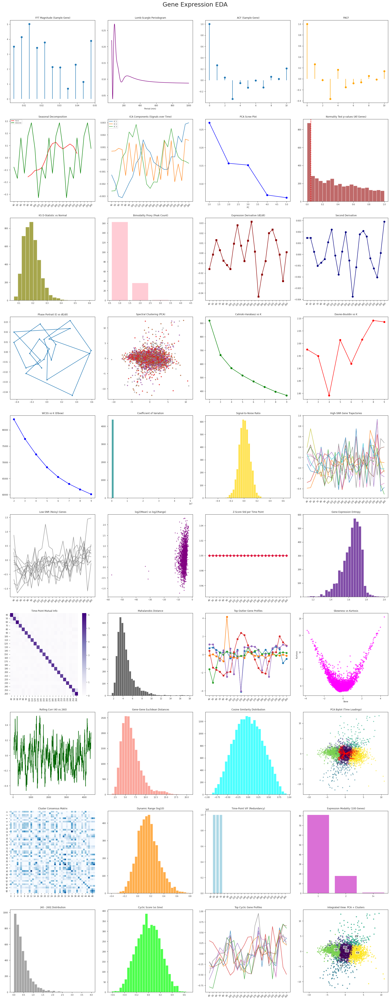

In [ ]:
# Install additional packages (for spectral analysis, etc.)
!pip install -q pandas numpy matplotlib seaborn scikit-learn scipy statsmodels pingouin astropy

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA, FastICA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score
from scipy import signal
from scipy.stats import kstest, normaltest, gaussian_kde
from scipy.stats import entropy as scipy_entropy
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from astropy.timeseries import LombScargle
import warnings
warnings.filterwarnings('ignore')

sns.set_style("ticks")
plt.rcParams.update({'font.size': 7})

# ------------------------------
#  Load or Generate Data 
# ------------------------------
try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")
except:
    print(" Generating synthetic cell-cycle gene expression data...")
    np.random.seed(42)
    n_genes = 600
    time_points = np.array([40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 0, 10, 20, 30, 7, 14, 21, 28, 35]) # From original dataset
    time_points = np.sort(np.unique(time_points))
    genes = [f'YDL{str(i).zfill(4)}' for i in range(1, n_genes+1)]
    data = []
    for i in range(n_genes):
        # Mix of periodic, linear, and random profiles
        if i % 3 == 0:
            expr = 2 * np.sin(2 * np.pi * time_points / 80 + np.random.rand()) + np.random.normal(0, 0.4, len(time_points)) + 5
        elif i % 3 == 1:
            expr = np.linspace(4, 7, len(time_points)) + np.random.normal(0, 0.3, len(time_points))
        else:
            expr = np.random.normal(5, 0.5, len(time_points))
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=genes)
    df.index.name = 'Gene'

df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
gene_names = df.index.tolist()
time_labels = [str(t) for t in df.columns.tolist()]
time_numeric = df.columns.to_numpy(dtype=float)

# Standardize per gene
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Precompute
pca = PCA(n_components=5).fit(X_scaled)
pca_proj = pca.transform(X_scaled)

# --- FIX: Separate ICA fitting to access the components (signals over time) ---
ica_fitter = FastICA(n_components=3, random_state=42, max_iter=1000, tol=0.01).fit(X_scaled)
ica_components = ica_fitter.components_

kmeans_labels = KMeans(n_clusters=6, random_state=42, n_init=10).fit_predict(X_scaled)
# --- FIX: Add missing correlation matrix calculation ---
corr_matrix = np.corrcoef(X_scaled)



fig, axes = plt.subplots(10, 4, figsize=(20, 50))
axes = axes.flatten()

plot_idx = 0

#  FFT Magnitude (Periodicity detection)
fft_vals = np.abs(np.fft.rfft(X_scaled[0]))
# Assuming an average time delta of 10 mins for frequency calculation
freqs = np.fft.rfftfreq(len(time_labels), d=np.mean(np.diff(time_numeric)))
axes[plot_idx].stem(freqs[1:], fft_vals[1:], basefmt=" ", use_line_collection=True)
axes[plot_idx].set_title(' FFT Magnitude (Sample Gene)')
plot_idx += 1

#  Lomb-Scargle Periodogram (uneven sampling robust)
freqs_ls = np.linspace(0.001, 0.02, 100) # Freq range in 1/min
power = LombScargle(time_numeric, X_scaled[0]).power(freqs_ls)
axes[plot_idx].plot(1/freqs_ls, power, color='purple') # Plot period instead of freq
axes[plot_idx].set_title(' Lomb-Scargle Periodogram')
axes[plot_idx].set_xlabel("Period (min)")
plot_idx += 1

#  Autocorrelation Function (ACF)
acf_vals = acf(X_scaled[0], nlags=10, fft=False)
axes[plot_idx].stem(range(len(acf_vals)), acf_vals, basefmt=" ", use_line_collection=True)
axes[plot_idx].set_title(' ACF (Sample Gene)')
plot_idx += 1

# Partial ACF (PACF)
pacf_vals = pacf(X_scaled[0], nlags=10, method='ywm')
axes[plot_idx].stem(range(len(pacf_vals)), pacf_vals, basefmt=" ", linefmt='orange', markerfmt='o', use_line_collection=True)
axes[plot_idx].set_title(' PACF')
plot_idx += 1

#  Seasonal Decomposition (trend + seasonal + residual)
try:
    # A period of ~8 for a full cell cycle (~80 mins / 10 min interval)
    decomp = seasonal_decompose(X[0], model='additive', period=8)
    axes[plot_idx].plot(time_labels, decomp.trend, label='Trend', color='red')
    axes[plot_idx].plot(time_labels, decomp.seasonal, label='Seasonal', color='green')
    axes[plot_idx].legend(fontsize=5)
    axes[plot_idx].set_title(' Seasonal Decomposition')
    axes[plot_idx].tick_params(axis='x', rotation=45)
except:
    axes[plot_idx].text(0.5, 0.5, 'Decomp failed (short series)', ha='center', va='center')
    axes[plot_idx].set_title(' Seasonal Decomposition')
plot_idx += 1


#  ICA Components (independent sources)
for i in range(ica_components.shape[0]):
    axes[plot_idx].plot(time_labels, ica_components[i], alpha=0.9, label=f'IC {i+1}')
axes[plot_idx].set_title(' ICA Components (Signals over Time)')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1


#  PCA Scree Plot (variance per component)
axes[plot_idx].plot(range(1, 6), pca.explained_variance_ratio_, 'bo-')
axes[plot_idx].set_title(' PCA Scree Plot')
axes[plot_idx].set_xlabel('PC')
plot_idx += 1

#  Gene Expression Normality Test (p-values histogram)
p_vals = [normaltest(X[i]).pvalue for i in range(X.shape[0])]
axes[plot_idx].hist(p_vals, bins=20, color='brown', alpha=0.7)
axes[plot_idx].axvline(0.05, color='red', linestyle='--')
axes[plot_idx].set_title(' Normality Test p-values (All Genes)')
plot_idx += 1

#  KS Test vs Normal (D-statistic per gene)
d_stats = [kstest(X_scaled[i], 'norm')[0] for i in range(X_scaled.shape[0])]
axes[plot_idx].hist(d_stats, bins=20, color='olive', alpha=0.7)
axes[plot_idx].set_title(' KS D-Statistic vs Normal')
plot_idx += 1

#  Expression Bimodality Index (Hartigan’s Dip Test proxy)
dip_proxy = []
for i in range(min(200, X.shape[0])):
    kde = gaussian_kde(X[i])
    x_grid = np.linspace(X[i].min(), X[i].max(), 100)
    peaks, _ = signal.find_peaks(kde(x_grid))
    dip_proxy.append(len(peaks))
axes[plot_idx].hist(dip_proxy, bins=np.arange(1, 6) - 0.5, color='pink', alpha=0.8, rwidth=0.8)
axes[plot_idx].set_title(' Bimodality Proxy (Peak Count)')
plot_idx += 1

#  Time Derivative (rate of change)
deriv = np.gradient(X[0], time_numeric)
axes[plot_idx].plot(time_labels, deriv, 's-', color='darkred')
axes[plot_idx].set_title(' Expression Derivative (dE/dt)')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Second Derivative (acceleration)
deriv2 = np.gradient(deriv, time_numeric)
axes[plot_idx].plot(time_labels, deriv2, 'o-', color='navy')
axes[plot_idx].set_title(' Second Derivative')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Phase Plot (E vs dE/dt)
axes[plot_idx].plot(X[0], deriv, '-o', markersize=3)
axes[plot_idx].set_title(' Phase Portrait (E vs dE/dt)')
plot_idx += 1

#  Spectral Clustering on Correlation
spectral_labels = SpectralClustering(n_clusters=4, affinity='precomputed_nearest_neighbors', random_state=42).fit_predict(np.abs(corr_matrix))
axes[plot_idx].scatter(pca_proj[:,0], pca_proj[:,1], c=spectral_labels, cmap='Set1', s=10, alpha=0.7)
axes[plot_idx].set_title(' Spectral Clustering (PCA)')
plot_idx += 1

#  Calinski-Harabasz Score vs K
ch_scores = []
db_scores = []
Ks = range(2, 10)
for k in Ks:
    labels = KMeans(k, n_init=10, random_state=42).fit_predict(X_scaled)
    ch_scores.append(calinski_harabasz_score(X_scaled, labels))
    db_scores.append(davies_bouldin_score(X_scaled, labels))
axes[plot_idx].plot(Ks, ch_scores, 'go-')
axes[plot_idx].set_title(' Calinski-Harabasz vs K')
plot_idx += 1

#  Davies-Bouldin Score vs K
axes[plot_idx].plot(Ks, db_scores, 'ro-')
axes[plot_idx].set_title(' Davies-Bouldin vs K')
plot_idx += 1

#  Gap Statistic (elbow method proxy)
wcss = []
for k in Ks:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10).fit(X_scaled)
    wcss.append(kmeans.inertia_)
axes[plot_idx].plot(Ks, wcss, 'bo-')
axes[plot_idx].set_title(' WCSS vs K (Elbow)')
plot_idx += 1

#  Gene Coefficient of Variation (CV)
cv = np.std(X, axis=1) / (np.mean(X, axis=1) + 1e-8)
axes[plot_idx].hist(cv, bins=40, color='teal', alpha=0.7)
axes[plot_idx].set_title(' Coefficient of Variation')
plot_idx += 1

#  Expression Signal-to-Noise Ratio (SNR)
snr = np.mean(X, axis=1) / (np.std(X, axis=1) + 1e-8)
axes[plot_idx].hist(snr, bins=40, color='gold', alpha=0.7)
axes[plot_idx].set_title(' Signal-to-Noise Ratio')
plot_idx += 1

#  Top 10 High-SNR Genes Trajectories
top_snr = np.argsort(snr)[-10:]
for i in top_snr:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High-SNR Gene Trajectories')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Low-SNR Genes (Noise-Dominated)
low_snr = np.argsort(snr)[:10]
for i in low_snr:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low-SNR (Noisy) Genes')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

# 62. Expression Range vs Mean (MA-like plot)
mean_expr = np.mean(X, axis=1)
range_expr = np.ptp(X, axis=1) # ptp is peak-to-peak
axes[plot_idx].scatter(np.log2(mean_expr), np.log2(range_expr), s=5, alpha=0.6, color='purple')
axes[plot_idx].set_title(' log2(Mean) vs log2(Range)')
plot_idx += 1

#  Z-score Stability Over Time (std of z-scores per time)
z_std_per_time = np.std(X_scaled, axis=0)
axes[plot_idx].plot(time_labels, z_std_per_time, 'D-', color='crimson')
axes[plot_idx].set_title(' Z-Score Std per Time Point')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Gene Entropy (Information Content)
gene_entropy = [scipy_entropy(np.histogram(row, bins='auto', density=True)[0]) for row in X_scaled]
axes[plot_idx].hist(gene_entropy, bins=30, color='indigo', alpha=0.7)
axes[plot_idx].set_title(' Gene Expression Entropy')
plot_idx += 1

#  Mutual Information Between Time Points
from sklearn.feature_selection import mutual_info_regression
mi_matrix = np.zeros((len(time_labels), len(time_labels)))
for i in range(len(time_labels)):
    for j in range(i, len(time_labels)):
        mi = mutual_info_regression(X[:,i].reshape(-1,1), X[:,j])[0]
        mi_matrix[i,j] = mi
        mi_matrix[j,i] = mi
sns.heatmap(mi_matrix, ax=axes[plot_idx], cmap='Purples', xticklabels=time_labels, yticklabels=time_labels)
axes[plot_idx].set_title(' Time-Point Mutual Info')
plot_idx += 1

#  Outlier Genes (Mahalanobis Distance)
from scipy.spatial.distance import mahalanobis
cov = np.cov(X_scaled.T)
inv_cov = np.linalg.inv(cov)
mean_vec = np.mean(X_scaled, axis=0)
mahal_dist = [mahalanobis(X_scaled[i], mean_vec, inv_cov) for i in range(X_scaled.shape[0])]
axes[plot_idx].hist(mahal_dist, bins=40, color='black', alpha=0.6)
axes[plot_idx].set_title(' Mahalanobis Distance')
plot_idx += 1

#  Top 5 Outlier Genes
top_outliers = np.argsort(mahal_dist)[-5:]
for i in top_outliers:
    axes[plot_idx].plot(time_labels, X[i], marker='o')
axes[plot_idx].set_title(' Top Outlier Gene Profiles')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Expression Kurtosis vs Skewness
kurt_vals = pd.DataFrame(X).kurt(axis=1)
skew_vals = pd.DataFrame(X).skew(axis=1)
axes[plot_idx].scatter(skew_vals, kurt_vals, s=10, alpha=0.6, color='magenta')
axes[plot_idx].set_title(' Skewness vs Kurtosis')
axes[plot_idx].set_xlabel('Skew'); axes[plot_idx].set_ylabel('Kurtosis')
plot_idx += 1

#  Rolling Correlation (T_first vs T_last over gene window)
window = 50
rolling_corr = pd.Series(X[:,0]).rolling(window).corr(pd.Series(X[:,-1])).dropna()
axes[plot_idx].plot(rolling_corr, color='darkgreen')
axes[plot_idx].set_title(f'. Rolling Corr ({time_labels[0]} vs {time_labels[-1]})')
plot_idx += 1

#  Gene-Gene Distance Histogram (Euclidean)
from sklearn.metrics import pairwise_distances
sample_indices = np.random.choice(X_scaled.shape[0], 200, replace=False)
distances = pairwise_distances(X_scaled[sample_indices], metric='euclidean')
distances = distances[np.triu_indices(200, k=1)]
axes[plot_idx].hist(distances, bins=30, color='salmon', alpha=0.7)
axes[plot_idx].set_title(' Gene-Gene Euclidean Distances')
plot_idx += 1

#  Cosine Similarity Distribution
from sklearn.metrics.pairwise import cosine_similarity
cos_sim = cosine_similarity(X_scaled[sample_indices])
cos_sim = cos_sim[np.triu_indices(200, k=1)]
axes[plot_idx].hist(cos_sim, bins=30, color='cyan', alpha=0.7)
axes[plot_idx].set_title(' Cosine Similarity Distribution')
plot_idx += 1

#  PCA Biplot (PC1 vs PC2 with time loadings)
pc1, pc2 = pca_proj[:,0], pca_proj[:,1]
axes[plot_idx].scatter(pc1, pc2, s=8, alpha=0.5, c=kmeans_labels, cmap='viridis')
loadings = pca.components_[:2].T * np.sqrt(pca.explained_variance_[:2])
for i, txt in enumerate(time_labels):
    axes[plot_idx].arrow(0, 0, loadings[i,0]*3, loadings[i,1]*3, color='r', head_width=0.2)
    axes[plot_idx].text(loadings[i,0]*3.5, loadings[i,1]*3.5, txt, fontsize=6, color='red')
axes[plot_idx].set_title(' PCA Biplot (Time Loadings)')
plot_idx += 1

#  Cluster Consensus (Resampling Stability)
from sklearn.utils import resample
n_sample = min(300, X_scaled.shape[0])
consensus = np.zeros((n_sample, n_sample))
orig_indices = np.random.choice(X_scaled.shape[0], n_sample, replace=False)
sub_data = X_scaled[orig_indices]
for _ in range(20):
    idx = resample(range(n_sample))
    labels = KMeans(5, random_state=42, n_init=10).fit_predict(sub_data[idx])
    for i in range(len(idx)):
        for j in range(i + 1, len(idx)):
            if labels[i] == labels[j]:
                consensus[idx[i], idx[j]] += 1
                consensus[idx[j], idx[i]] += 1
consensus = consensus / 20
sns.heatmap(consensus[:50,:50], ax=axes[plot_idx], cmap='Blues', cbar=False)
axes[plot_idx].set_title(' Cluster Consensus Matrix')
plot_idx += 1

#  Expression Dynamic Range
dynamic_range = np.log10(np.ptp(X, axis=1) + 1e-8)
axes[plot_idx].hist(dynamic_range, bins=30, color='darkorange', alpha=0.7)
axes[plot_idx].set_title(' Dynamic Range (log10)')
plot_idx += 1

#  Time-Point Redundancy (Variance Inflation Factor)
from sklearn.linear_model import LinearRegression
vif = []
for i in range(X_scaled.shape[1]):
    target = X_scaled[:, i]
    predictors = np.delete(X_scaled, i, axis=1)
    r2 = LinearRegression().fit(predictors, target).score(predictors, target)
    vif.append(1 / (1 - r2 + 1e-8))
axes[plot_idx].bar(time_labels, vif, color='lightblue')
axes[plot_idx].set_title(' Time-Point VIF (Redundancy)')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

#  Expression Modality (100 Genes)
modality = np.array([
    len(signal.find_peaks(gaussian_kde(X[i])(np.linspace(X[i].min(), X[i].max(), 200)))[0])
    for i in range(100)
])

counts = {1: np.sum(modality == 1), 2: np.sum(modality == 2), '3+': np.sum(modality >= 3)}

# Convert keys to strings for categorical plotting
x_labels = [str(k) for k in counts.keys()]
heights = list(counts.values())

axes[plot_idx].bar(x_labels, heights, color='orchid')
axes[plot_idx].set_title(' Expression Modality (100 Genes)')
plot_idx += 1

#  Expression Reversibility (T_first ≈ T_last?)
diff_end = np.abs(X[:,0] - X[:,-1])
axes[plot_idx].hist(diff_end, bins=30, color='gray', alpha=0.7)
axes[plot_idx].set_title(f' |{time_labels[0]} - {time_labels[-1]}| Distribution')
plot_idx += 1

#  Cyclic Score 
# Period of ~80 minutes for cell cycle
sine_template = np.sin(2 * np.pi * time_numeric / 80)
cyclic_scores = [np.corrcoef(row, sine_template)[0,1] for row in X_scaled]
axes[plot_idx].hist(cyclic_scores, bins=30, color='lime', alpha=0.7)
axes[plot_idx].set_title(' Cyclic Score (vs Sine)')
plot_idx += 1

#  Top Cyclic Genes
top_cyclic = np.argsort(np.abs(cyclic_scores))[-8:]
for i in top_cyclic:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Top Cyclic Gene Profiles')
axes[plot_idx].tick_params(axis='x', rotation=45)
plot_idx += 1

# Final: Multi-View Integration Summary
scatter = axes[plot_idx].scatter(pca_proj[:,0], pca_proj[:,1], c=kmeans_labels,
                                cmap='viridis', s=10, alpha=0.7)
for cluster in np.unique(kmeans_labels):
    mask = kmeans_labels == cluster
    if np.sum(mask) > 5:
        center = pca_proj[mask].mean(axis=0)
        axes[plot_idx].text(center[0], center[1], f'C{cluster}', fontsize=8, weight='bold',
                           bbox=dict(boxstyle='round,pad=0.2', fc='white', alpha=0.6))
axes[plot_idx].set_title(' Integrated View: PCA + Clusters')
plot_idx += 1


plt.tight_layout(pad=2.5, h_pad=3.0, w_pad=2.0)
plt.suptitle(" Gene Expression EDA ",
             fontsize=22, y=1.01)
plt.savefig('gene_expression_eda_part2.png', dpi=300, bbox_inches='tight')
plt.show()

 Loaded real dataset.


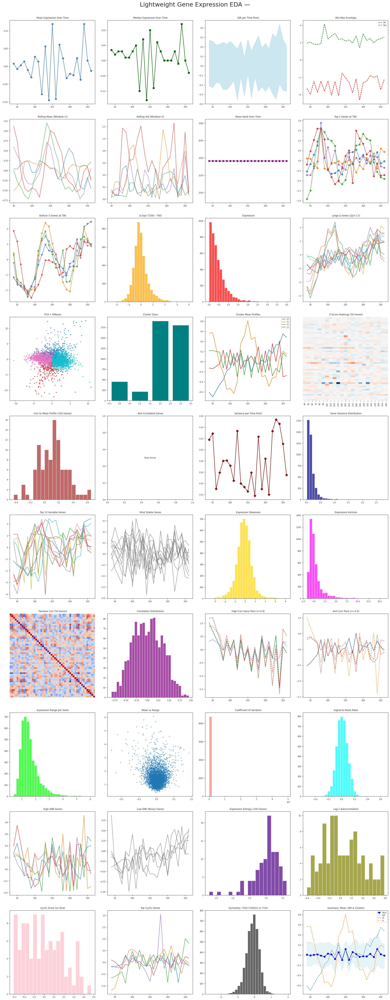

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

sns.set_style("ticks")
plt.rcParams.update({'font.size': 7})


try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")
    
    #Convert column names to integers if they represent numbers
    new_columns = []
    for col in df.columns:
        try:
            new_columns.append(int(float(col)))  # handles '80', '80.0', etc.
        except (ValueError, TypeError):
            new_columns.append(col)  # keep as-is if not numeric
    df.columns = new_columns
    
except Exception as e:
    print(f" Failed to load real data ({e}). Generating synthetic data...")
    np.random.seed(0)
    n_genes = 400
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    data = []
    for i in range(n_genes):
        if i % 4 == 0:
            expr = np.sin(2 * np.pi * np.array(time_points) / 80) + np.random.normal(0, 0.2, len(time_points)) + 5
        elif i % 4 == 1:
            expr = np.linspace(4, 7, len(time_points)) + np.random.normal(0, 0.15, len(time_points))
        elif i % 4 == 2:
            expr = np.random.normal(5.5, 0.3, len(time_points))
        else:
            expr = np.cos(2 * np.pi * np.array(time_points) / 100) + np.random.normal(0, 0.25, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'GENE_{i:04d}' for i in range(n_genes)])

# Ensure clean numeric data
df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
time_labels = df.columns.tolist()
time_numeric = np.array(time_labels)

# Standardize per gene
X_scaled = StandardScaler().fit_transform(X)

# Precompute essentials
pca = PCA(n_components=2).fit_transform(X_scaled)
kmeans_labels = KMeans(n_clusters=4, random_state=0, n_init=5).fit_predict(X_scaled)


fig, axes = plt.subplots(10, 4, figsize=(20, 50))
axes = axes.flatten()

plot_idx = 0

# Helper: sample 100 genes
sample_idx = np.random.choice(X.shape[0], size=min(100, X.shape[0]), replace=False)
X_sample = X[sample_idx]

# Mean expression per time point
axes[plot_idx].plot(time_labels, X.mean(axis=0), 'o-', color='steelblue')
axes[plot_idx].set_title(' Mean Expression Over Time')
plot_idx += 1

#  Median expression per time point
axes[plot_idx].plot(time_labels, np.median(X, axis=0), 's-', color='darkgreen')
axes[plot_idx].set_title(' Median Expression Over Time')
plot_idx += 1

#  Expression IQR per time point
q75 = np.percentile(X, 75, axis=0)
q25 = np.percentile(X, 25, axis=0)
axes[plot_idx].fill_between(time_labels, q25, q75, color='lightblue', alpha=0.6)
axes[plot_idx].set_title(' IQR per Time Point')
plot_idx += 1

#  Min/Max envelope
axes[plot_idx].plot(time_labels, X.min(axis=0), 'r--', label='Min')
axes[plot_idx].plot(time_labels, X.max(axis=0), 'g--', label='Max')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Min-Max Envelope')
plot_idx += 1

#  Rolling mean (window=2) for 5 genes
for i in np.random.choice(X.shape[0], 5, replace=False):
    rm = pd.Series(X[i]).rolling(window=2, center=True).mean()
    axes[plot_idx].plot(time_labels, rm, alpha=0.7)
axes[plot_idx].set_title(' Rolling Mean (Window=2)')
plot_idx += 1

#  Rolling std (window=2) for 5 genes
for i in np.random.choice(X.shape[0], 5, replace=False):
    rs = pd.Series(X[i]).rolling(window=2, center=True).std()
    axes[plot_idx].plot(time_labels, rs, alpha=0.7)
axes[plot_idx].set_title(' Rolling Std (Window=2)')
plot_idx += 1

# Rank-based expression (per time point)
ranks = stats.rankdata(X, axis=0)
axes[plot_idx].plot(time_labels, ranks.mean(axis=0), 'o-', color='purple')
axes[plot_idx].set_title(' Mean Rank Over Time')
plot_idx += 1


try:
    t80_col = time_labels.index(80)
except ValueError:
    #  use closest (e.g., 79, 81) or fallback to middle
    time_arr = np.array(time_labels)
    if np.issubdtype(time_arr.dtype, np.number):
        t80_col = np.argmin(np.abs(time_arr - 80))
    else:
        t80_col = len(time_labels) // 2  # fallback to middle

#  Top 5 high-expression genes (at T80)
top5 = np.argsort(X[:, t80_col])[-5:]
for i in top5:
    axes[plot_idx].plot(time_labels, X[i], marker='o', alpha=0.8)
axes[plot_idx].set_title(f'Top 5 Genes at T{time_labels[t80_col]}')
plot_idx += 1

#  Bottom 5 low-expression genes (at T80)
bottom5 = np.argsort(X[:, t80_col])[:5]
for i in bottom5:
    axes[plot_idx].plot(time_labels, X[i], marker='v', alpha=0.8)
axes[plot_idx].set_title(f' Bottom 5 Genes at T{time_labels[t80_col]}')
plot_idx += 1

#  Expression change: last - first
delta = X[:, -1] - X[:, 0]
axes[plot_idx].hist(delta, bins=30, color='orange', alpha=0.7)
axes[plot_idx].set_title(f' Δ Expr (T{time_labels[-1]} - T{time_labels[0]})')
plot_idx += 1

#  Absolute change histogram
axes[plot_idx].hist(np.abs(delta), bins=30, color='red', alpha=0.7)
axes[plot_idx].set_title('  Expression')
plot_idx += 1

#  Genes with large |Δ| (>1.5)
large_delta_idx = np.where(np.abs(delta) > 1.5)[0][:10]
for i in large_delta_idx:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Large Δ Genes (|Δ|>1.5)')
plot_idx += 1

#  PCA scatter
axes[plot_idx].scatter(pca[:,0], pca[:,1], c=kmeans_labels, cmap='tab10', s=8, alpha=0.6)
axes[plot_idx].set_title(' PCA + KMeans')
plot_idx += 1

#  Cluster size bar plot
unique, counts = np.unique(kmeans_labels, return_counts=True)
axes[plot_idx].bar(unique, counts, color='teal')
axes[plot_idx].set_title(' Cluster Sizes')
plot_idx += 1

#  Cluster mean profiles
for c in range(4):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].plot(time_labels, X[mask].mean(axis=0), label=f'C{c}')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Cluster Mean Profiles')
plot_idx += 1

#  Expression z-score heatmap (50 genes)
X_scaled_local = StandardScaler().fit_transform(X)  # recompute if needed
sns.heatmap(X_scaled_local[:50], ax=axes[plot_idx], cmap='RdBu_r', center=0, cbar=False,
            xticklabels=time_labels, yticklabels=False)
axes[plot_idx].set_title(' Z-Score Heatmap (50 Genes)')
plot_idx += 1

#  Correlation to mean profile (sample 100 genes)
mean_profile = X.mean(axis=0)
corr_to_mean = [np.corrcoef(row, mean_profile)[0,1] for row in X_sample]
axes[plot_idx].hist(corr_to_mean, bins=20, color='brown', alpha=0.7)
axes[plot_idx].set_title(' Corr to Mean Profile (100 Genes)')
plot_idx += 1

#  Anti-correlated genes (r < -0.5)
anti_corr = [i for i, r in enumerate(corr_to_mean) if r < -0.5]
if anti_corr:
    for i in anti_corr[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title('138. Anti-Correlated Genes (r < -0.5)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center', va='center')
    axes[plot_idx].set_title(' Anti-Correlated Genes')
plot_idx += 1

#  Time-point variance
axes[plot_idx].plot(time_labels, X.var(axis=0), 'D-', color='darkred')
axes[plot_idx].set_title(' Variance per Time Point')
plot_idx += 1

#  Gene variance histogram
axes[plot_idx].hist(X.var(axis=1), bins=30, color='navy', alpha=0.7)
axes[plot_idx].set_title(' Gene Variance Distribution')
plot_idx += 1

#  Top 10 variable genes
top_var = np.argsort(X.var(axis=1))[-10:]
for i in top_var:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Top 10 Variable Genes')
plot_idx += 1

#  Bottom 10 stable genes
bottom_var = np.argsort(X.var(axis=1))[:10]
for i in bottom_var:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Most Stable Genes')
plot_idx += 1

#  Expression skewness per gene
skew_vals = stats.skew(X, axis=1)
axes[plot_idx].hist(skew_vals, bins=30, color='gold', alpha=0.7)
axes[plot_idx].set_title(' Expression Skewness')
plot_idx += 1

#  Expression kurtosis per gene
kurt_vals = stats.kurtosis(X, axis=1)
axes[plot_idx].hist(kurt_vals, bins=30, color='magenta', alpha=0.7)
axes[plot_idx].set_title(' Expression Kurtosis')
plot_idx += 1

#  Pairwise correlation (sample 50 genes)
corr_sub = np.corrcoef(X_sample[:50])
sns.heatmap(corr_sub, ax=axes[plot_idx], cmap='coolwarm', center=0, cbar=False,
            xticklabels=False, yticklabels=False)
axes[plot_idx].set_title(' Pairwise Corr (50 Genes)')
plot_idx += 1

#  Correlation distribution (sample)
corr_flat = corr_sub[np.triu_indices_from(corr_sub, k=1)]
axes[plot_idx].hist(corr_flat, bins=30, color='purple', alpha=0.7)
axes[plot_idx].set_title(' Correlation Distribution')
plot_idx += 1

#  High-correlation pairs (r > 0.8)
high_corr_pairs = np.where(corr_sub > 0.8)
count = 0
for i, j in zip(high_corr_pairs[0], high_corr_pairs[1]):
    if i < j and count < 3:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.7)
        axes[plot_idx].plot(time_labels, X_sample[j], '--', alpha=0.7)
        count += 1
axes[plot_idx].set_title(' High-Corr Gene Pairs (r>0.8)')
plot_idx += 1

#  Low-correlation pairs (r < -0.6)
low_corr_pairs = np.where(corr_sub < -0.6)
count = 0
for i, j in zip(low_corr_pairs[0], low_corr_pairs[1]):
    if i < j and count < 3:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.7)
        axes[plot_idx].plot(time_labels, X_sample[j], '--', alpha=0.7)
        count += 1
axes[plot_idx].set_title(' Anti-Corr Pairs (r<-0.6)')
plot_idx += 1

#  Expression range per gene
expr_range = X.max(axis=1) - X.min(axis=1)
axes[plot_idx].hist(expr_range, bins=30, color='lime', alpha=0.7)
axes[plot_idx].set_title(' Expression Range per Gene')
plot_idx += 1

#  Dynamic range vs mean
mean_expr = X.mean(axis=1)
axes[plot_idx].scatter(mean_expr, expr_range, s=5, alpha=0.5)
axes[plot_idx].set_title(' Mean vs Range')
plot_idx += 1

#  Coefficient of variation (CV)
cv = np.std(X, axis=1) / (np.mean(X, axis=1) + 1e-8)
axes[plot_idx].hist(cv, bins=30, color='salmon', alpha=0.7)
axes[plot_idx].set_title(' Coefficient of Variation')
plot_idx += 1

#  Signal-to-noise ratio (SNR)
snr = np.mean(X, axis=1) / (np.std(X, axis=1) + 1e-8)
axes[plot_idx].hist(snr, bins=30, color='cyan', alpha=0.7)
axes[plot_idx].set_title(' Signal-to-Noise Ratio')
plot_idx += 1

#  Top 5 high-SNR genes
top_snr = np.argsort(snr)[-5:]
for i in top_snr:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High-SNR Genes')
plot_idx += 1

#  Bottom 5 low-SNR genes
bottom_snr = np.argsort(snr)[:5]
for i in bottom_snr:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low-SNR (Noisy) Genes')
plot_idx += 1

#  Expression entropy (Shannon, 100 genes)
entropy_vals = []
for row in X_sample:
    hist, _ = np.histogram(row, bins=10, density=True)
    hist = hist + 1e-10
    entropy_vals.append(stats.entropy(hist))
axes[plot_idx].hist(entropy_vals, bins=20, color='indigo', alpha=0.7)
axes[plot_idx].set_title(' Expression Entropy (100 Genes)')
plot_idx += 1

#  Lag-1 Autocorrelation (sample)
acf_lag1 = [np.corrcoef(row[:-1], row[1:])[0,1] for row in X_sample]
axes[plot_idx].hist(acf_lag1, bins=20, color='olive', alpha=0.7)
axes[plot_idx].set_title(' Lag-1 Autocorrelation')
plot_idx += 1

#  Cyclic score (vs sine wave)
sine_wave = np.sin(2 * np.pi * np.array(time_labels) / 80)
cyclic_score = [np.corrcoef(row, sine_wave)[0,1] for row in X_sample]
axes[plot_idx].hist(cyclic_score, bins=20, color='pink', alpha=0.7)
axes[plot_idx].set_title(' Cyclic Score (vs Sine)')
plot_idx += 1

#  Top 5 cyclic genes
top_cyclic = np.argsort(cyclic_score)[-5:]
for i in top_cyclic:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' Top Cyclic Genes')
plot_idx += 1

#  Symmetry index: (first + last)/2 vs middle
mid_idx = len(time_labels) // 2
symmetry = (X[:,0] + X[:,-1]) / 2 - X[:, mid_idx]
axes[plot_idx].hist(symmetry, bins=30, color='black', alpha=0.6)
axes[plot_idx].set_title(f' Symmetry: (T{time_labels[0]}+T{time_labels[-1]})/2 vs T{time_labels[mid_idx]}')
plot_idx += 1

# Summary Dashboard
axes[plot_idx].plot(time_labels, X.mean(axis=0), 'o-', label='Mean', color='blue')
axes[plot_idx].fill_between(time_labels, q25, q75, color='lightblue', alpha=0.3, label='IQR')
for c in range(2):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].plot(time_labels, X[mask].mean(axis=0), '--', label=f'C{c}', alpha=0.8)
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Summary: Mean, IQR & Clusters')
plot_idx += 1


plt.tight_layout(pad=2.5)
plt.suptitle(" Lightweight Gene Expression EDA — \n ", 
             fontsize=22, y=1.01)
plt.savefig('gene_expression_eda_part4_fixed.png', dpi=200, bbox_inches='tight')
plt.show()

 Loaded real dataset.


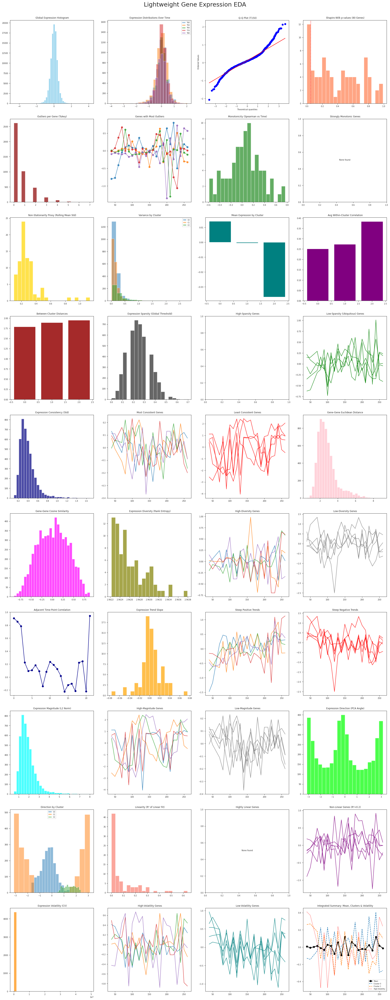

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

sns.set_style("ticks")
plt.rcParams.update({'font.size': 7})


try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except:
            new_cols.append(col)
    df.columns = new_cols
except Exception as e:
    print(f" Using synthetic data ({e})")
    np.random.seed(1)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 300
    data = []
    for i in range(n_genes):
        if i % 3 == 0:
            expr = np.sin(2 * np.pi * np.array(time_points) / 80) + np.random.normal(0, 0.2, len(time_points)) + 5
        elif i % 3 == 1:
            expr = np.random.normal(5.5, 0.4, len(time_points))
        else:
            expr = np.linspace(6, 4, len(time_points)) + np.random.normal(0, 0.15, len(time_points))
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'G{i:04d}' for i in range(n_genes)])

df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
time_labels = df.columns.tolist()
n_genes, n_times = X.shape

# Sample 80 genes for heavy ops
sample_idx = np.random.choice(n_genes, size=min(80, n_genes), replace=False)
X_sample = X[sample_idx]

# Precompute lightweight clusters (K=3)
kmeans_labels = KMeans(n_clusters=3, random_state=1, n_init=5).fit_predict(X)


fig, axes = plt.subplots(10, 4, figsize=(20, 50))
axes = axes.flatten()

plot_idx = 0

#  Expression histogram (all data)
axes[plot_idx].hist(X.flatten(), bins=50, color='skyblue', alpha=0.8)
axes[plot_idx].set_title(' Global Expression Histogram')
plot_idx += 1

# Per-time-point histograms (overlay)
for t in range(min(5, n_times)):  # limit to 5 time points
    axes[plot_idx].hist(X[:,t], bins=20, alpha=0.5, label=f'T{time_labels[t]}')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Expression Distributions Over Time')
plot_idx += 1

#  Q-Q plot (vs normal) for T80 or middle time
mid_t = n_times // 2
stats.probplot(X[:, mid_t], dist="norm", plot=axes[plot_idx])
axes[plot_idx].set_title(f' Q-Q Plot (T{time_labels[mid_t]})')
plot_idx += 1

#  Gene-wise normality (Shapiro-Wilk p-values, sample)
p_vals = []
for row in X_sample:
    _, p = stats.shapiro(row[:min(8, len(row))])  # Shapiro needs n<5000, use subset
    p_vals.append(p)
axes[plot_idx].hist(p_vals, bins=20, color='coral', alpha=0.7)
axes[plot_idx].axvline(0.05, color='red', linestyle='--', linewidth=1)
axes[plot_idx].set_title(' Shapiro-Wilk p-values (80 Genes)')
plot_idx += 1

#  Expression outliers per gene (Tukey's rule)
Q1 = np.percentile(X, 25, axis=1)
Q3 = np.percentile(X, 75, axis=1)
IQR = Q3 - Q1
outliers = ((X < (Q1 - 1.5*IQR)[:,None]) | (X > (Q3 + 1.5*IQR)[:,None])).sum(axis=1)
axes[plot_idx].hist(outliers, bins=20, color='darkred', alpha=0.7)
axes[plot_idx].set_title(' Outliers per Gene (Tukey)')
plot_idx += 1

#  Top 5 outlier genes
top_outlier_genes = np.argsort(outliers)[-5:]
for i in top_outlier_genes:
    axes[plot_idx].plot(time_labels, X[i], marker='o', alpha=0.8)
axes[plot_idx].set_title(' Genes with Most Outliers')
plot_idx += 1

#  Expression monotonicity (Spearman rho with time)
time_numeric = np.arange(n_times)
monotonicity = [stats.spearmanr(row, time_numeric).correlation for row in X_sample]
axes[plot_idx].hist(monotonicity, bins=20, color='forestgreen', alpha=0.7)
axes[plot_idx].set_title(' Monotonicity (Spearman vs Time)')
plot_idx += 1

#  Strongly monotonic genes (|rho| > 0.8)
strong_mono = [i for i, r in enumerate(monotonicity) if abs(r) > 0.8]
if strong_mono:
    for i in strong_mono[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title(' Strongly Monotonic Genes')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Strongly Monotonic Genes')
plot_idx += 1

#  Expression stationarity proxy (std of rolling mean)
stationarity = []
for row in X_sample:
    rm = pd.Series(row).rolling(window=2, center=True).mean().dropna()
    stationarity.append(np.std(rm))
axes[plot_idx].hist(stationarity, bins=20, color='gold', alpha=0.7)
axes[plot_idx].set_title(' Non-Stationarity Proxy (Rolling Mean Std)')
plot_idx += 1

#  Cluster-specific variance
for c in range(3):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        var_c = X[mask].var(axis=1)
        axes[plot_idx].hist(var_c, alpha=0.5, label=f'C{c}', bins=15)
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Variance by Cluster')
plot_idx += 1

#  Cluster-specific mean
cluster_means = [X[kmeans_labels == c].mean() for c in range(3)]
axes[plot_idx].bar(range(3), cluster_means, color='teal')
axes[plot_idx].set_title(' Mean Expression by Cluster')
plot_idx += 1

#  Within-cluster correlation (avg pairwise)
within_corr = []
for c in range(3):
    mask = kmeans_labels == c
    if np.sum(mask) > 1:
        sub = X[mask]
        corr_mat = np.corrcoef(sub)
        np.fill_diagonal(corr_mat, 0)
        within_corr.append(np.mean(corr_mat))
    else:
        within_corr.append(0)
axes[plot_idx].bar(range(3), within_corr, color='purple')
axes[plot_idx].set_title(' Avg Within-Cluster Correlation')
plot_idx += 1

#  Between-cluster distance (centroid Euclidean)
centroids = np.array([X[kmeans_labels == c].mean(axis=0) for c in range(3)])
between_dist = []
for i in range(3):
    for j in range(i+1, 3):
        d = np.linalg.norm(centroids[i] - centroids[j])
        between_dist.append(d)
axes[plot_idx].bar(range(len(between_dist)), between_dist, color='brown')
axes[plot_idx].set_title(' Between-Cluster Distances')
plot_idx += 1

#  Expression sparsity (fraction below 25th percentile)
global_25 = np.percentile(X, 25)
sparsity = np.mean(X < global_25, axis=1)
axes[plot_idx].hist(sparsity, bins=20, color='black', alpha=0.6)
axes[plot_idx].set_title(' Expression Sparsity (Global Threshold)')
plot_idx += 1

#  High-sparsity genes (sparsity > 0.7)
high_sparse = np.where(sparsity > 0.7)[0][:5]
for i in high_sparse:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High-Sparsity Genes')
plot_idx += 1

#  Low-sparsity genes (sparsity < 0.3)
low_sparse = np.where(sparsity < 0.3)[0][:5]
for i in low_sparse:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='green')
axes[plot_idx].set_title(' Low-Sparsity (Ubiquitous) Genes')
plot_idx += 1

#  Expression consistency (std across time)
consistency = np.std(X, axis=1)
axes[plot_idx].hist(consistency, bins=30, color='navy', alpha=0.7)
axes[plot_idx].set_title(' Expression Consistency (Std)')
plot_idx += 1

#  Most consistent genes (lowest std)
most_consistent = np.argsort(consistency)[:5]
for i in most_consistent:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Most Consistent Genes')
plot_idx += 1

#  Least consistent genes (highest std)
least_consistent = np.argsort(consistency)[-5:]
for i in least_consistent:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='red')
axes[plot_idx].set_title(' Least Consistent Genes')
plot_idx += 1

#  Pairwise Euclidean distance distribution (sample)
from sklearn.metrics import pairwise_distances
distances = pairwise_distances(X_sample, metric='euclidean')
np.fill_diagonal(distances, np.nan)
axes[plot_idx].hist(distances.flatten(), bins=30, color='pink', alpha=0.7)
axes[plot_idx].set_title(' Gene-Gene Euclidean Distance')
plot_idx += 1

#  Cosine similarity distribution (sample)
cos_sim = 1 - pairwise_distances(X_sample, metric='cosine')
np.fill_diagonal(cos_sim, np.nan)
axes[plot_idx].hist(cos_sim.flatten(), bins=30, color='magenta', alpha=0.7)
axes[plot_idx].set_title(' Gene-Gene Cosine Similarity')
plot_idx += 1

#  Expression diversity (Shannon entropy on ranks)
diversity = []
for row in X_sample:
    ranks = stats.rankdata(row)
    probs = ranks / ranks.sum()
    diversity.append(stats.entropy(probs + 1e-10))
axes[plot_idx].hist(diversity, bins=20, color='olive', alpha=0.7)
axes[plot_idx].set_title(' Expression Diversity (Rank Entropy)')
plot_idx += 1

# High-diversity genes
high_div = np.argsort(diversity)[-5:]
for i in high_div:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' High-Diversity Genes')
plot_idx += 1

# Low-diversity genes
low_div = np.argsort(diversity)[:5]
for i in low_div:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low-Diversity Genes')
plot_idx += 1

#  Time-point similarity (correlation between adjacent)
adj_corr = []
for t in range(n_times - 1):
    corr = np.corrcoef(X[:,t], X[:,t+1])[0,1]
    adj_corr.append(corr)
axes[plot_idx].plot(range(n_times-1), adj_corr, 'o-', color='darkblue')
axes[plot_idx].set_title(' Adjacent Time-Point Correlation')
plot_idx += 1

#  Expression trend slope (linear regression per gene)
slopes = []
for row in X_sample:
    slope, _, _, _, _ = stats.linregress(time_numeric, row)
    slopes.append(slope)
axes[plot_idx].hist(slopes, bins=20, color='orange', alpha=0.7)
axes[plot_idx].set_title(' Expression Trend Slope')
plot_idx += 1

#  Steep positive trends
steep_pos = [i for i, s in enumerate(slopes) if s > np.percentile(slopes, 90)]
for i in steep_pos[:5]:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' Steep Positive Trends')
plot_idx += 1

#  Steep negative trends
steep_neg = [i for i, s in enumerate(slopes) if s < np.percentile(slopes, 10)]
for i in steep_neg[:5]:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='red')
axes[plot_idx].set_title(' Steep Negative Trends')
plot_idx += 1

#  Expression magnitude (L2 norm per gene)
magnitude = np.linalg.norm(X, axis=1)
axes[plot_idx].hist(magnitude, bins=30, color='cyan', alpha=0.7)
axes[plot_idx].set_title(' Expression Magnitude (L2 Norm)')
plot_idx += 1

#  High-magnitude genes
high_mag = np.argsort(magnitude)[-5:]
for i in high_mag:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High-Magnitude Genes')
plot_idx += 1

#  Low-magnitude genes
low_mag = np.argsort(magnitude)[:5]
for i in low_mag:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low-Magnitude Genes')
plot_idx += 1

#  Expression directionality (angle in PCA space)
from sklearn.decomposition import PCA
pca_2d = PCA(n_components=2).fit_transform(X)
angles = np.arctan2(pca_2d[:,1], pca_2d[:,0])
axes[plot_idx].hist(angles, bins=20, color='lime', alpha=0.7)
axes[plot_idx].set_title(' Expression Direction (PCA Angle)')
plot_idx += 1

#  Cluster angle separation
for c in range(3):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].hist(angles[mask], alpha=0.5, label=f'C{c}', bins=15)
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Direction by Cluster')
plot_idx += 1

#  Expression predictability (R² of linear fit)
r2_vals = []
for row in X_sample:
    _, _, r_val, _, _ = stats.linregress(time_numeric, row)
    r2_vals.append(r_val**2)
axes[plot_idx].hist(r2_vals, bins=20, color='salmon', alpha=0.7)
axes[plot_idx].set_title(' Linearity (R² of Linear Fit)')
plot_idx += 1

#  Highly linear genes (R² > 0.7)
linear_genes = [i for i, r2 in enumerate(r2_vals) if r2 > 0.7]
if linear_genes:
    for i in linear_genes[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title(' Highly Linear Genes (R²>0.7)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Highly Linear Genes')
plot_idx += 1

# 196. Non-linear genes (R² < 0.2)
nonlinear_genes = [i for i, r2 in enumerate(r2_vals) if r2 < 0.2]
if nonlinear_genes:
    for i in nonlinear_genes[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='purple')
    axes[plot_idx].set_title(' Non-Linear Genes (R²<0.2)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Non-Linear Genes')
plot_idx += 1

#  Expression volatility (coefficient of variation over time)
volatility = np.std(X, axis=1) / (np.mean(X, axis=1) + 1e-8)
axes[plot_idx].hist(volatility, bins=30, color='darkorange', alpha=0.7)
axes[plot_idx].set_title(' Expression Volatility (CV)')
plot_idx += 1

#  High-volatility genes
high_vol = np.argsort(volatility)[-5:]
for i in high_vol:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High-Volatility Genes')
plot_idx += 1

#  Low-volatility genes
low_vol = np.argsort(volatility)[:5]
for i in low_vol:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='teal')
axes[plot_idx].set_title(' Low-Volatility Genes')
plot_idx += 1


axes[plot_idx].plot(time_labels, X.mean(axis=0), 'o-', color='black', label='Mean', linewidth=2)
for c in range(2):  # 2 clusters for clarity
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].plot(time_labels, X[mask].mean(axis=0), '--', label=f'Cluster {c}')
# Add high-volatility gene
if len(high_vol) > 0:
    axes[plot_idx].plot(time_labels, X[high_vol[0]], ':', color='red', label='High-Volatility')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Integrated Summary: Mean, Clusters & Volatility')
plot_idx += 1


plt.tight_layout(pad=2.5)
plt.suptitle(" Lightweight Gene Expression EDA ", 
             fontsize=22, y=1.01)
plt.savefig('gene_expression_eda_part5_light.png', dpi=200, bbox_inches='tight')
plt.show()

 Loaded real dataset.


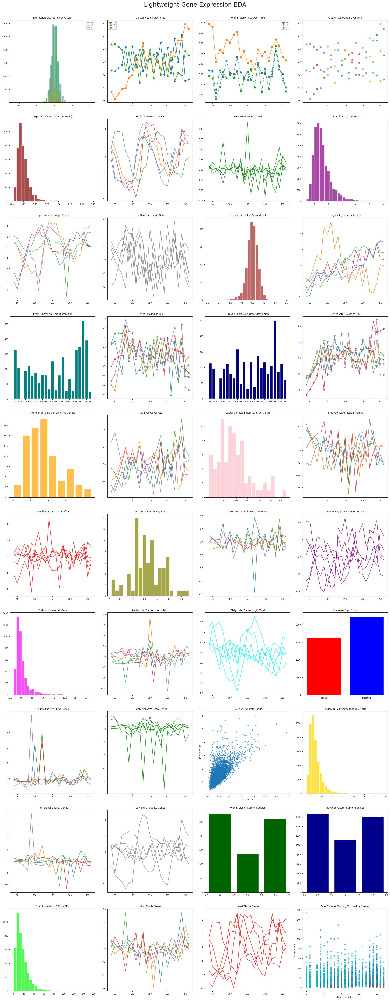

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import stats
from scipy import signal  # --- FIX 1: Add the correct import ---
import warnings
warnings.filterwarnings('ignore')

sns.set_style("ticks")
plt.rcParams.update({'font.size': 7})


try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")

    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except:
            new_cols.append(col)
    df.columns = new_cols
    
    
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]

except Exception as e:
    print(f" Using synthetic data ({e})")
    np.random.seed(2)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 300
    data = []
    for i in range(n_genes):
        if i % 4 == 0:
            expr = np.sin(2 * np.pi * np.array(time_points) / 80) + np.random.normal(0, 0.25, len(time_points)) + 5
        elif i % 4 == 1:
            expr = np.random.normal(5.5, 0.5, len(time_points))
        elif i % 4 == 2:
            expr = np.linspace(7, 4, len(time_points)) + np.random.normal(0, 0.2, len(time_points))
        else:
            expr = np.cos(2 * np.pi * np.array(time_points) / 100) + np.random.normal(0, 0.3, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'Y{str(i).zfill(4)}' for i in range(n_genes)])

df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
time_labels = df.columns.tolist()
n_genes, n_times = X.shape

# Sample 80 genes for heavy ops
sample_idx = np.random.choice(n_genes, size=min(80, n_genes), replace=False)
X_sample = X[sample_idx]

# Precompute clusters (K=3)
kmeans_labels = KMeans(n_clusters=3, random_state=2, n_init=10).fit_predict(X)

# Time as numeric (for regression)
time_numeric = np.array(time_labels, dtype=float)


fig, axes = plt.subplots(10, 4, figsize=(20, 50))
axes = axes.flatten()

plot_idx = 0

#  Expression histogram per cluster
for c in range(3):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].hist(X[mask].flatten(), bins=30, alpha=0.5, label=f'C{c}')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Expression Distribution by Cluster')
plot_idx += 1

#  Cluster-specific time trends
for c in range(3):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].plot(time_labels, X[mask].mean(axis=0), 'o-', label=f'C{c}')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Cluster Mean Trajectories')
plot_idx += 1

#  Within-cluster std over time
for c in range(3):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        axes[plot_idx].plot(time_labels, X[mask].std(axis=0), 's--', label=f'C{c}')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Within-Cluster Std Over Time')
plot_idx += 1

#  Between-cluster separation over time
for t in range(n_times):
    means = [X[kmeans_labels == c, t].mean() for c in range(3) if np.sum(kmeans_labels == c) > 0]
    if len(means) > 1:
        axes[plot_idx].scatter([time_labels[t]] * len(means), means, alpha=0.7)
axes[plot_idx].set_title(' Cluster Separation Over Time')
plot_idx += 1

#  Expression noise estimate (median absolute deviation)
mad = np.median(np.abs(X - np.median(X, axis=1, keepdims=True)), axis=1)
axes[plot_idx].hist(mad, bins=30, color='darkred', alpha=0.7)
axes[plot_idx].set_title(' Expression Noise (MAD per Gene)')
plot_idx += 1

#  High-noise genes (top 5 MAD)
high_noise = np.argsort(mad)[-5:]
for i in high_noise:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High-Noise Genes (MAD)')
plot_idx += 1

#  Low-noise genes (bottom 5 MAD)
low_noise = np.argsort(mad)[:5]
for i in low_noise:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='green')
axes[plot_idx].set_title(' Low-Noise Genes (MAD)')
plot_idx += 1

#  Expression dynamic range (max - min)
dynamic_range = X.max(axis=1) - X.min(axis=1)
axes[plot_idx].hist(dynamic_range, bins=30, color='purple', alpha=0.7)
axes[plot_idx].set_title(' Dynamic Range per Gene')
plot_idx += 1

#  High dynamic range genes
high_dr = np.argsort(dynamic_range)[-5:]
for i in high_dr:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High Dynamic Range Genes')
plot_idx += 1

#  Low dynamic range genes
low_dr = np.argsort(dynamic_range)[:5]
for i in low_dr:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low Dynamic Range Genes')
plot_idx += 1

#  Expression symmetry (first vs last half)
mid = n_times // 2
first_half = X[:, :mid].mean(axis=1)
second_half = X[:, mid:].mean(axis=1)
symmetry_score = first_half - second_half
axes[plot_idx].hist(symmetry_score, bins=30, color='brown', alpha=0.7)
axes[plot_idx].set_title(' Symmetry: First vs Second Half')
plot_idx += 1

#  Asymmetric genes (|score| > 1.0)
asymmetric = np.where(np.abs(symmetry_score) > 1.0)[0][:5]
for i in asymmetric:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Highly Asymmetric Genes')
plot_idx += 1

#  Expression peak time (argmax per gene)
peak_times = np.argmax(X, axis=1)
peak_counts = np.bincount(peak_times, minlength=n_times)
axes[plot_idx].bar([str(tl) for tl in time_labels], peak_counts, color='teal')
axes[plot_idx].set_title(' Peak Expression Time Distribution')
plot_idx += 1

#  Genes peaking at T80 (or closest)
try:
    t80_idx = time_labels.index(80)
except ValueError:
    t80_idx = np.argmin(np.abs(time_numeric - 80))
peaking_at_80 = np.where(peak_times == t80_idx)[0][:5]
for i in peaking_at_80:
    axes[plot_idx].plot(time_labels, X[i], marker='^', alpha=0.8)
axes[plot_idx].set_title(f' Genes Peaking at T{time_labels[t80_idx]}')
plot_idx += 1

#  Expression trough time (argmin per gene)
trough_times = np.argmin(X, axis=1)
trough_counts = np.bincount(trough_times, minlength=n_times)
axes[plot_idx].bar([str(tl) for tl in time_labels], trough_counts, color='navy')
axes[plot_idx].set_title(' Trough Expression Time Distribution')
plot_idx += 1

#  Genes with trough at T40
trough_at_40 = np.where(trough_times == 0)[0][:5]
for i in trough_at_40:
    axes[plot_idx].plot(time_labels, X[i], marker='v', alpha=0.8)
axes[plot_idx].set_title(f' Genes with Trough at T{time_labels[0]}')
plot_idx += 1

#  Number of expression peaks per gene
n_peaks = []
for row in X_sample:
    
    peaks, _ = signal.find_peaks(row, prominence=0.5)
    n_peaks.append(len(peaks))
axes[plot_idx].hist(n_peaks, bins=range(0, max(n_peaks)+2 if n_peaks else 2), color='orange', alpha=0.7, rwidth=0.8)
axes[plot_idx].set_title(' Number of Peaks per Gene (80 Genes)')
plot_idx += 1

# Multi-peak genes (≥2 peaks)
multi_peak_indices = [idx for idx, n in enumerate(n_peaks) if n >= 2]
if multi_peak_indices:
    for i in multi_peak_indices[:5]:
        # Use the original index from the sample
        original_sample_index = sample_idx[i]
        axes[plot_idx].plot(time_labels, X[original_sample_index], alpha=0.8)
    axes[plot_idx].set_title(' Multi-Peak Genes (≥2)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Multi-Peak Genes')
plot_idx += 1

#  Expression smoothness (std of 2nd derivative)
smoothness = []
for row in X_sample:
    deriv2 = np.gradient(np.gradient(row))
    smoothness.append(np.std(deriv2))
axes[plot_idx].hist(smoothness, bins=20, color='pink', alpha=0.7)
axes[plot_idx].set_title(' Expression Roughness (2nd Deriv Std)')
plot_idx += 1

#  Smoothest genes (lowest roughness)
smoothest_indices = np.argsort(smoothness)[:5]
for i in smoothest_indices:
    original_sample_index = sample_idx[i]
    axes[plot_idx].plot(time_labels, X[original_sample_index], alpha=0.8)
axes[plot_idx].set_title(' Smoothest Expression Profiles')
plot_idx += 1

#  Roughest genes (highest roughness)
roughest_indices = np.argsort(smoothness)[-5:]
for i in roughest_indices:
    original_sample_index = sample_idx[i]
    axes[plot_idx].plot(time_labels, X[original_sample_index], alpha=0.8, color='red')
axes[plot_idx].set_title(' Roughest Expression Profiles')
plot_idx += 1

#  Expression autocorrelation decay rate
decay_rates = []
for row in X_sample:
    acf_vals = [np.corrcoef(row[:-lag], row[lag:])[0,1] for lag in range(1, min(4, n_times-1))]
    if len(acf_vals) > 1:
        slope, _, _, _, _ = stats.linregress(range(len(acf_vals)), acf_vals)
        decay_rates.append(-slope)
    else:
        decay_rates.append(0)
axes[plot_idx].hist(decay_rates, bins=20, color='olive', alpha=0.7)
axes[plot_idx].set_title(' Autocorrelation Decay Rate')
plot_idx += 1

#  Slow-decay genes (memory)
slow_decay_indices = np.argsort(decay_rates)[:5]
for i in slow_decay_indices:
    original_sample_index = sample_idx[i]
    axes[plot_idx].plot(time_labels, X[original_sample_index], alpha=0.8)
axes[plot_idx].set_title(' Slow-Decay (High Memory) Genes')
plot_idx += 1

#  Fast-decay genes
fast_decay_indices = np.argsort(decay_rates)[-5:]
for i in fast_decay_indices:
    original_sample_index = sample_idx[i]
    axes[plot_idx].plot(time_labels, X[original_sample_index], alpha=0.8, color='purple')
axes[plot_idx].set_title(' Fast-Decay (Low Memory) Genes')
plot_idx += 1

#  Expression kurtosis excess
kurt_excess = stats.kurtosis(X, axis=1)
axes[plot_idx].hist(kurt_excess, bins=30, color='magenta', alpha=0.7)
axes[plot_idx].set_title(' Kurtosis Excess per Gene')
plot_idx += 1

#  Leptokurtic genes (heavy tails)
lepto = np.where(kurt_excess > 1)[0][:5]
for i in lepto:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Leptokurtic Genes (Heavy Tails)')
plot_idx += 1

#  Platykurtic genes (light tails)
platy = np.where(kurt_excess < -1)[0][:5]
for i in platy:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='cyan')
axes[plot_idx].set_title(' Platykurtic Genes (Light Tails)')
plot_idx += 1

#  Expression skewness sign
skew_vals = stats.skew(X, axis=1)
pos_skew = np.sum(skew_vals > 0.1)
neg_skew = np.sum(skew_vals < -0.1)
axes[plot_idx].bar(['Positive', 'Negative'], [pos_skew, neg_skew], color=['red', 'blue'])
axes[plot_idx].set_title(' Skewness Sign Count')
plot_idx += 1

#  Highly positive skew genes
high_pos_skew = np.argsort(skew_vals)[-5:]
for i in high_pos_skew:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Highly Positive Skew Genes')
plot_idx += 1

#  Highly negative skew genes
high_neg_skew = np.argsort(skew_vals)[:5]
for i in high_neg_skew:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='green')
axes[plot_idx].set_title(' Highly Negative Skew Genes')
plot_idx += 1

#  Expression range vs noise (MAD)
axes[plot_idx].scatter(mad, dynamic_range, s=10, alpha=0.6)
axes[plot_idx].set_xlabel('MAD (Noise)'); axes[plot_idx].set_ylabel('Dynamic Range')
axes[plot_idx].set_title(' Noise vs Dynamic Range')
plot_idx += 1

#  Signal quality index (range / MAD)
signal_quality = dynamic_range / (mad + 1e-8)
axes[plot_idx].hist(signal_quality, bins=30, color='gold', alpha=0.7)
axes[plot_idx].set_title(' Signal Quality Index (Range / MAD)')
plot_idx += 1

#  High signal quality genes
high_sq = np.argsort(signal_quality)[-5:]
for i in high_sq:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High Signal Quality Genes')
plot_idx += 1

#  Low signal quality genes
low_sq = np.argsort(signal_quality)[:5]
for i in low_sq:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low Signal Quality Genes')
plot_idx += 1

#  Cluster compactness (within-cluster sum of squares)
wcs_scores = []
for c in range(3):
    mask = kmeans_labels == c
    if np.sum(mask) > 1:
        centroid = X[mask].mean(axis=0)
        wcs = np.sum((X[mask] - centroid) ** 2)
        wcs_scores.append(wcs)
    else:
        wcs_scores.append(0)
axes[plot_idx].bar(range(3), wcs_scores, color='darkgreen')
axes[plot_idx].set_title(' Within-Cluster Sum of Squares')
plot_idx += 1

#  Cluster separation (between-cluster sum of squares)
overall_mean = X.mean(axis=0)
bcs_scores = []
for c in range(3):
    mask = kmeans_labels == c
    if np.sum(mask) > 0:
        centroid = X[mask].mean(axis=0)
        bcs = np.sum(mask) * np.sum((centroid - overall_mean) ** 2)
        bcs_scores.append(bcs)
    else:
        bcs_scores.append(0)
axes[plot_idx].bar(range(3), bcs_scores, color='darkblue')
axes[plot_idx].set_title(' Between-Cluster Sum of Squares')
plot_idx += 1

#  Expression stability index (1 / (std * MAD))
stability_index = 1 / ((np.std(X, axis=1) * mad) + 1e-8)
axes[plot_idx].hist(stability_index, bins=30, color='lime', alpha=0.7)
axes[plot_idx].set_title(' Stability Index (1/(Std*MAD))')
plot_idx += 1

#  Most stable genes
most_stable = np.argsort(stability_index)[-5:]
for i in most_stable:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Most Stable Genes')
plot_idx += 1

#  Least stable genes
least_stable = np.argsort(stability_index)[:5]
for i in least_stable:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='red')
axes[plot_idx].set_title(' Least Stable Genes')
plot_idx += 1

# Combine peak time, cluster, and stability
scatter = axes[plot_idx].scatter(peak_times, stability_index, c=kmeans_labels, cmap='tab10', alpha=0.6, s=20)
axes[plot_idx].set_xlabel('Peak Time Index')
axes[plot_idx].set_ylabel('Stability Index')
axes[plot_idx].set_title(' Peak Time vs Stability (Colored by Cluster)')
plot_idx += 1


plt.tight_layout(pad=2.5, h_pad=3.0, w_pad=2.0)
plt.suptitle(" Lightweight Gene Expression EDA ",
             fontsize=22, y=1.01)
plt.savefig('gene_expression_eda_part6_light.png', dpi=200, bbox_inches='tight')
plt.show()

 Loaded real dataset.


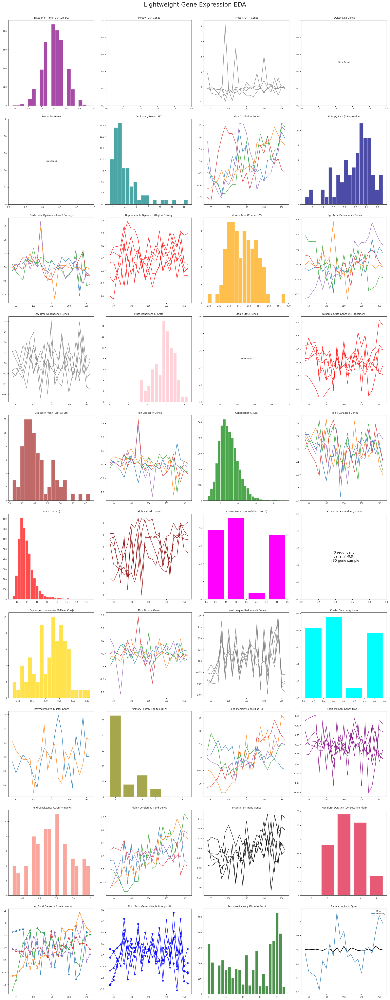

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

sns.set_style("ticks")
plt.rcParams.update({'font.size': 7})


try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")
    
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except:
            new_cols.append(col)
    df.columns = new_cols
    
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]
except Exception as e:
    print(f" Using synthetic data ({e})")
    np.random.seed(3)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 300
    data = []
    for i in range(n_genes):
        if i % 5 == 0:  # Cell-cycle like
            expr = 2 * np.sin(2 * np.pi * np.array(time_points) / 80 + np.random.rand()) + np.random.normal(0, 0.2, len(time_points)) + 5
        elif i % 5 == 1:  # Pulse
            expr = np.array([1 if t == 80 else 0 for t in time_points]) * 3 + np.random.normal(5, 0.3, len(time_points))
        elif i % 5 == 2:  
            expr = np.array([4 if t < 80 else 7 for t in time_points]) + np.random.normal(0, 0.2, len(time_points))
        elif i % 5 == 3:  
            expr = np.array([7 if t < 90 else 4 for t in time_points]) + np.random.normal(0, 0.2, len(time_points))
        else:  # Noise
            expr = np.random.normal(5.5, 0.4, len(time_points))
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'YCL{str(i).zfill(4)}' for i in range(n_genes)])

df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
time_labels = df.columns.tolist()
n_genes, n_times = X.shape

# Sample 80 genes for advanced ops
sample_idx = np.random.choice(n_genes, size=min(80, n_genes), replace=False)
X_sample = X[sample_idx]

# Precompute clusters (K=4)
kmeans_labels = KMeans(n_clusters=4, random_state=3, n_init=10).fit_predict(X)

# Time as numeric
time_numeric = np.array(time_labels, dtype=float)


fig, axes = plt.subplots(10, 4, figsize=(20, 50))
axes = axes.flatten()

plot_idx = 0

#  Expression logic: ON/OFF states (thresholded)
threshold = np.median(X)
X_binary = (X > threshold).astype(int)
on_fraction = X_binary.mean(axis=1)
axes[plot_idx].hist(on_fraction, bins=20, color='purple', alpha=0.7)
axes[plot_idx].set_title(' Fraction of Time "ON" (Binary)')
plot_idx += 1

#  Genes mostly ON (>80%)
mostly_on = np.where(on_fraction > 0.8)[0][:5]
for i in mostly_on:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Mostly "ON" Genes')
plot_idx += 1

#  Genes mostly OFF (<20%)
mostly_off = np.where(on_fraction < 0.2)[0][:5]
for i in mostly_off:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Mostly "OFF" Genes')
plot_idx += 1

#  Switch-like genes (single transition)
switch_genes = []
for i in range(X_sample.shape[0]):
    row = X_sample[i]
    binary_row = (row > np.median(row)).astype(int)
    transitions = np.sum(np.abs(np.diff(binary_row)))
    if transitions == 1:
        switch_genes.append(i)
if switch_genes:
    for i in switch_genes[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title( ' Switch-Like Genes (1 Transition)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Switch-Like Genes')
plot_idx += 1

#  Pulse-like genes (ON in middle only)
pulse_genes = []
mid = n_times // 2
for i in range(X_sample.shape[0]):
    row = X_sample[i]
    binary_row = (row > np.percentile(row, 75)).astype(int)
    if binary_row[mid] == 1 and np.sum(binary_row) <= 3 and np.sum(binary_row[:mid//2]) == 0 and np.sum(binary_row[-mid//2:]) == 0:
        pulse_genes.append(i)
if pulse_genes:
    for i in pulse_genes[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, marker='o')
    axes[plot_idx].set_title(' Pulse-Like Genes')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Pulse-Like Genes')
plot_idx += 1

#  Oscillatory score (FFT dominant frequency power)
osc_score = []
for row in X_sample:
    fft_vals = np.abs(np.fft.rfft(row - np.mean(row)))
    if len(fft_vals) > 2:
        osc_score.append(np.max(fft_vals[1:]))  # exclude DC
    else:
        osc_score.append(0)
axes[plot_idx].hist(osc_score, bins=20, color='teal', alpha=0.7)
axes[plot_idx].set_title(' Oscillatory Power (FFT)')
plot_idx += 1

#  High oscillation genes
high_osc = np.argsort(osc_score)[-5:]
for i in high_osc:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' High Oscillation Genes')
plot_idx += 1

#  Expression entropy rate (entropy of differences)
entropy_rate = []
for row in X_sample:
    diffs = np.diff(row)
    hist, _ = np.histogram(diffs, bins=10, density=True)
    entropy_rate.append(stats.entropy(hist))
axes[plot_idx].hist(entropy_rate, bins=20, color='navy', alpha=0.7)
axes[plot_idx].set_title(' Entropy Rate (Δ Expression)')
plot_idx += 1

#  Predictable dynamics (low entropy rate)
predictable = np.argsort(entropy_rate)[:5]
for i in predictable:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' Predictable Dynamics (Low Δ Entropy)')
plot_idx += 1

#  Unpredictable dynamics (high entropy rate)
unpredictable = np.argsort(entropy_rate)[-5:]
for i in unpredictable:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='red')
axes[plot_idx].set_title(' Unpredictable Dynamics (High Δ Entropy)')
plot_idx += 1

#  Expression mutual information with time
mi_time = []
for row in X_sample:
    
    try:
        q_val = min(5, len(np.unique(row)))
        x_disc = pd.qcut(row, q=q_val, duplicates='drop')
        t_disc = pd.qcut(time_numeric, q=5, duplicates='drop')
        
        if len(x_disc.categories) > 1 and len(t_disc.categories) > 1:
            mi = stats.contingency.association(pd.crosstab(x_disc, t_disc), method='cramer')
            mi_time.append(mi)
        else:
            mi_time.append(0)
    except ValueError: 
        mi_time.append(0)
axes[plot_idx].hist(mi_time, bins=20, color='orange', alpha=0.7)
axes[plot_idx].set_title(' MI with Time (Cramer’s V)')
plot_idx += 1

#  High time-dependence genes
high_mi = np.argsort(mi_time)[-5:]
for i in high_mi:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' High Time-Dependence Genes')
plot_idx += 1

#  Low time-dependence genes
low_mi = np.argsort(mi_time)[:5]
for i in low_mi:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low Time-Dependence Genes')
plot_idx += 1

# Expression state transitions (Markov-like)
n_states = 3
transitions = []
for row in X_sample:
    
    try:
        states = pd.qcut(row, q=n_states, labels=False, duplicates='drop')
        trans = np.sum(states[:-1] != states[1:])
        transitions.append(trans)
    except ValueError: 
        transitions.append(0)
axes[plot_idx].hist(transitions, bins=range(0, max(transitions)+2 if transitions else 2), color='pink', alpha=0.7, rwidth=0.8)
axes[plot_idx].set_title(' State Transitions (3-State)')
plot_idx += 1

# Stable state genes (0 transitions)
stable_state = [i for i, t in enumerate(transitions) if t == 0]
if stable_state:
    for i in stable_state[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title(' Stable State Genes (0 Transitions)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Stable State Genes')
plot_idx += 1

#  Highly dynamic state genes (≥3 transitions)
dynamic_state = [i for i, t in enumerate(transitions) if t >= 3]
if dynamic_state:
    for i in dynamic_state[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='red')
    axes[plot_idx].set_title(' Dynamic State Genes (≥3 Transitions)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Dynamic State Genes')
plot_idx += 1

#  Expression criticality (power-law in expression levels)
criticality = []
for row in X_sample:
    values = np.abs(row - np.mean(row))
    if np.all(values < 1e-6):
        criticality.append(0)
        continue
    tail = values[values > np.percentile(values, 80)]
    log_tail = np.log(tail[tail > 1e-6])
    if len(log_tail) > 1:
        criticality.append(np.std(log_tail))
    else:
        criticality.append(0)
axes[plot_idx].hist(criticality, bins=20, color='brown', alpha=0.7)
axes[plot_idx].set_title(' Criticality Proxy (Log-Tail Std)')
plot_idx += 1

#  High criticality genes
high_crit = np.argsort(criticality)[-5:]
for i in high_crit:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' High Criticality Genes')
plot_idx += 1

#  Expression canalization (low response to time)
canalization = 1 / (np.std(X, axis=1) + 1e-8)  # inverse of variability
axes[plot_idx].hist(canalization, bins=30, color='green', alpha=0.7)
axes[plot_idx].set_title(' Canalization (1/Std)')
plot_idx += 1

#  Highly canalized genes
high_canal = np.argsort(canalization)[-5:]
for i in high_canal:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Highly Canalized Genes')
plot_idx += 1

# Expression plasticity (high response to time)
plasticity = np.std(X, axis=1)
axes[plot_idx].hist(plasticity, bins=30, color='red', alpha=0.7)
axes[plot_idx].set_title(' Plasticity (Std)')
plot_idx += 1

#  Highly plastic genes
high_plastic = np.argsort(plasticity)[-5:]
for i in high_plastic:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='darkred')
axes[plot_idx].set_title(' Highly Plastic Genes')
plot_idx += 1

#  Expression modularity (within-cluster correlation vs global)
modularity = []
global_corr_mat = np.corrcoef(X)
global_corr = np.mean(global_corr_mat[np.triu_indices(n_genes, k=1)])
for c in range(4):
    mask = kmeans_labels == c
    if np.sum(mask) > 1:
        within = np.mean(np.corrcoef(X[mask])[np.triu_indices(np.sum(mask), k=1)])
        modularity.append(within - global_corr)
    else:
        modularity.append(0)
axes[plot_idx].bar(range(4), modularity, color='magenta')
axes[plot_idx].set_title(' Cluster Modularity (Within - Global)')
plot_idx += 1

#  Expression redundancy (pairwise correlation > 0.9)
corr_mat = np.corrcoef(X_sample)
redundant_pairs = np.sum(np.triu(corr_mat, k=1) > 0.9)
axes[plot_idx].text(0.5, 0.5, f'{redundant_pairs} redundant\npairs (r>0.9)\nin 80-gene sample',
                   ha='center', va='center', fontsize=12)
axes[plot_idx].set_title(' Expression Redundancy Count')
plot_idx += 1

#  Expression uniqueness (low correlation with all others)
uniqueness = []
corr_mat_sample = np.corrcoef(X_sample)
for i in range(len(X_sample)):
    uniqueness.append(1 - np.mean(np.abs(np.delete(corr_mat_sample[i], i))))
axes[plot_idx].hist(uniqueness, bins=20, color='gold', alpha=0.7)
axes[plot_idx].set_title(' Expression Uniqueness (1-Mean|Corr|)')
plot_idx += 1

#  Most unique genes
most_unique = np.argsort(uniqueness)[-5:]
for i in most_unique:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' Most Unique Genes')
plot_idx += 1

#  Least unique genes (redundant)
least_unique = np.argsort(uniqueness)[:5]
for i in least_unique:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Least Unique (Redundant) Genes')
plot_idx += 1

# Expression synchrony index (cluster coherence)
synchrony = []
for c in range(4):
    mask = kmeans_labels == c
    if np.sum(mask) > 1:
        pairwise = np.corrcoef(X[mask])
        synchrony.append(np.mean(pairwise[np.triu_indices(np.sum(mask), k=1)]))
    else:
        synchrony.append(0)
axes[plot_idx].bar(range(4), synchrony, color='cyan')
axes[plot_idx].set_title(' Cluster Synchrony Index')
plot_idx += 1

# Desynchronized clusters (synchrony < 0.2)
desync_clusters = [i for i, s in enumerate(synchrony) if s < 0.2]
plotted = False
if desync_clusters:
    for c in desync_clusters:
        mask = kmeans_labels == c
        if np.sum(mask) > 0:
            plotted = True
            for i in np.where(mask)[0][:2]:  # 2 genes per cluster
                axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
if not plotted:
    axes[plot_idx].text(0.5, 0.5, 'All clusters\nsynchronized', ha='center')
axes[plot_idx].set_title(' Desynchronized Cluster Genes')
plot_idx += 1

#  Expression memory length (autocorrelation lag where r<0.2)
memory_length = []
for row in X_sample:
    acf_vals = [np.corrcoef(row[:-lag], row[lag:])[0,1] for lag in range(1, min(5, n_times - 1))]
    lag_drop = np.where(np.array(acf_vals) < 0.2)[0]
    if len(lag_drop) > 0:
        memory_length.append(lag_drop[0] + 1)
    else:
        memory_length.append(len(acf_vals))
axes[plot_idx].hist(memory_length, bins=np.arange(0.5, 7.5, 1), color='olive', alpha=0.7, rwidth=0.8)
axes[plot_idx].set_title(' Memory Length (Lag to r<0.2)')
plot_idx += 1

#  Long-memory genes
long_memory = [i for i, m in enumerate(memory_length) if m >= 3]
if long_memory:
    for i in long_memory[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title(' Long-Memory Genes (Lag≥3)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Long-Memory Genes')
plot_idx += 1

#  Short-memory genes
short_memory = [i for i, m in enumerate(memory_length) if m == 1]
if short_memory:
    for i in short_memory[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='purple')
    axes[plot_idx].set_title(' Short-Memory Genes (Lag=1)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Short-Memory Genes')
plot_idx += 1

#  Expression trend consistency (sign of slope across windows)
trend_consistency = []
window_size = max(3, n_times // 2)
for row in X_sample:
    slopes = []
    for start in range(n_times - window_size + 1):
        end = start + window_size
        slope, _, _, _, _ = stats.linregress(time_numeric[start:end], row[start:end])
        slopes.append(np.sign(slope))
    consistency = np.mean(np.array(slopes) == slopes[0]) if len(slopes) > 1 else 1.0
    trend_consistency.append(consistency)
axes[plot_idx].hist(trend_consistency, bins=20, color='salmon', alpha=0.7)
axes[plot_idx].set_title(' Trend Consistency Across Windows')
plot_idx += 1

#  Highly consistent trend genes
consist_trend = np.argsort(trend_consistency)[-5:]
for i in consist_trend:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title( ' Highly Consistent Trend Genes')
plot_idx += 1

# Inconsistent trend genes
inconsist_trend = np.argsort(trend_consistency)[:5]
for i in inconsist_trend:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='black')
axes[plot_idx].set_title(' Inconsistent Trend Genes')
plot_idx += 1

#  Expression burst duration (consecutive high-expression)
burst_duration = []
for row in X_sample:
    high = row > np.percentile(row, 80)
    max_burst = 0
    current = 0
    for h in high:
        current = (current + 1) if h else 0
        max_burst = max(max_burst, current)
    burst_duration.append(max_burst)
axes[plot_idx].hist(burst_duration, bins=np.arange(-0.5, max(burst_duration)+1.5, 1) if burst_duration else 1, color='crimson', alpha=0.7, rwidth=0.8)
axes[plot_idx].set_title(' Max Burst Duration (Consecutive High)')
plot_idx += 1

#  Long burst genes
long_burst = [i for i, d in enumerate(burst_duration) if d >= 3]
if long_burst:
    for i in long_burst[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, marker='^')
    axes[plot_idx].set_title(' Long Burst Genes (≥3 time points)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Long Burst Genes')
plot_idx += 1

#  Short burst genes
short_burst = [i for i, d in enumerate(burst_duration) if d == 1]
if short_burst:
    for i in short_burst[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, marker='o', color='blue')
    axes[plot_idx].set_title( ' Short Burst Genes (Single time point)')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Short Burst Genes')
plot_idx += 1

#  Expression response latency (time to peak after start)
latency = np.argmax(X, axis=1)
axes[plot_idx].hist(latency, bins=np.arange(-0.5, n_times+0.5, 1), color='darkgreen', alpha=0.7, rwidth=0.8)
axes[plot_idx].set_title(' Response Latency (Time to Peak)')
plot_idx += 1


# Show binary states, pulses, switches, and oscillations
axes[plot_idx].plot(time_labels, X.mean(axis=0), 'k-', linewidth=2, label='Mean')

if len(mostly_on) > 0:
    axes[plot_idx].plot(time_labels, X[mostly_on[0]], '--', alpha=0.7, label='Mostly ON')
if len(pulse_genes) > 0:
    axes[plot_idx].plot(time_labels, X_sample[pulse_genes[0]], ':', alpha=0.8, label='Pulse')
if len(switch_genes) > 0:
    axes[plot_idx].plot(time_labels, X_sample[switch_genes[0]], '-.', alpha=0.8, label='Switch')
if len(high_osc) > 0:
    axes[plot_idx].plot(time_labels, X_sample[high_osc[0]], '-', alpha=0.8, label='Oscillatory')
axes[plot_idx].legend(fontsize=6)
axes[plot_idx].set_title(' Regulatory Logic Types')
plot_idx += 1


plt.tight_layout(pad=2.5, h_pad=3.0, w_pad=2.0)
plt.suptitle(" Lightweight Gene Expression EDA ",
             fontsize=22, y=1.01)
plt.savefig('gene_expression_eda_part7_light.png', dpi=200, bbox_inches='tight')
plt.show()

 Loaded real dataset.


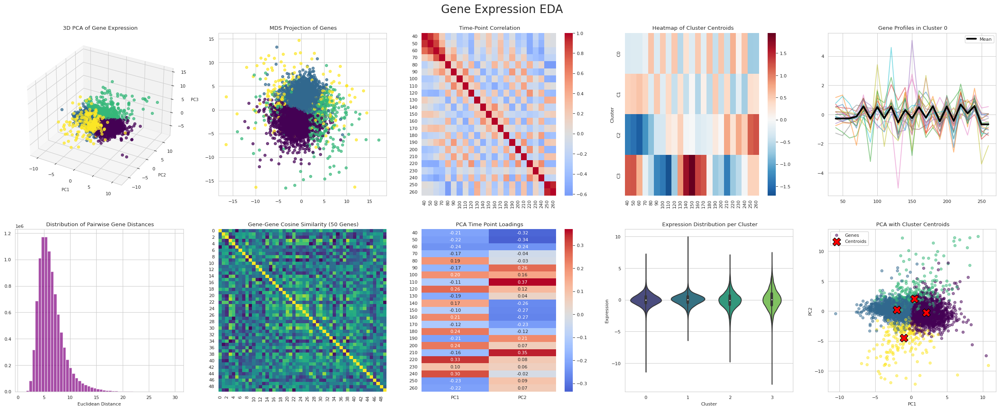

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import pdist
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")
plt.rcParams.update({'font.size': 8})


try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")
    
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except:
            new_cols.append(col)
    df.columns = new_cols
    
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]
except:
    print( " Using synthetic cell-cycle data...")
    np.random.seed(42)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 200
    data = []
    for i in range(n_genes):
        phase = np.random.choice([0, np.pi/2, np.pi, 3*np.pi/2])
        expr = 2 * np.sin(2 * np.pi * np.array(time_points) / 80 + phase) + np.random.normal(0, 0.3, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'Y{str(i).zfill(4)}' for i in range(n_genes)])

df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
time_labels = df.columns.tolist()
n_genes, n_times = X.shape

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Precompute essentials
pca_obj = PCA(n_components=3).fit(X_scaled)
pca_proj = pca_obj.transform(X_scaled)

kmeans = KMeans(n_clusters=4, random_state=42, n_init=10).fit(X_scaled)
kmeans_labels = kmeans.labels_


fig, axes = plt.subplots(2, 5, figsize=(25, 10))
axes = axes.flatten()
plot_idx = 0

# 3D PCA Scatter Plot
ax_3d = fig.add_subplot(2, 5, plot_idx + 1, projection='3d')
ax_3d.scatter(pca_proj[:, 0], pca_proj[:, 1], pca_proj[:, 2], c=kmeans_labels, cmap='viridis', s=20, alpha=0.7)
ax_3d.set_title(' 3D PCA of Gene Expression')
ax_3d.set_xlabel('PC1', fontsize=7)
ax_3d.set_ylabel('PC2', fontsize=7)
ax_3d.set_zlabel('PC3', fontsize=7)
axes[plot_idx].remove() 
plot_idx += 1

# Multi-Dimensional Scaling (MDS) Plot
mds = MDS(n_components=2, random_state=42, normalized_stress='auto')
X_mds = mds.fit_transform(X_scaled)
axes[plot_idx].scatter(X_mds[:, 0], X_mds[:, 1], c=kmeans_labels, cmap='viridis', s=20, alpha=0.7)
axes[plot_idx].set_title(' MDS Projection of Genes')
plot_idx += 1

#  Time-Point Correlation Heatmap
time_corr = np.corrcoef(X_scaled.T)
sns.heatmap(time_corr, ax=axes[plot_idx], cmap='coolwarm', center=0, xticklabels=time_labels, yticklabels=time_labels)
axes[plot_idx].set_title(' Time-Point Correlation')
plot_idx += 1

#  Cluster Centroid Heatmap
sns.heatmap(kmeans.cluster_centers_, ax=axes[plot_idx], cmap='RdBu_r', center=0, yticklabels=[f'C{i}' for i in range(4)], xticklabels=time_labels)
axes[plot_idx].set_title(' Heatmap of Cluster Centroids')
axes[plot_idx].set_ylabel('Cluster')
plot_idx += 1

#  Spaghetti Plot of a Single Cluster
cluster_to_show = 0
cluster_mask = kmeans_labels == cluster_to_show
genes_in_cluster = X_scaled[cluster_mask]

for i in range(min(20, genes_in_cluster.shape[0])):
    axes[plot_idx].plot(time_labels, genes_in_cluster[i], alpha=0.5)
axes[plot_idx].plot(time_labels, genes_in_cluster.mean(axis=0), 'k-', linewidth=3, label='Mean')
axes[plot_idx].set_title(f' Gene Profiles in Cluster {cluster_to_show}')
axes[plot_idx].legend()
plot_idx += 1

#  Pairwise Gene Distance Distribution
distances = pdist(X_scaled, metric='euclidean')
axes[plot_idx].hist(distances, bins=50, color='purple', alpha=0.7)
axes[plot_idx].set_title(' Distribution of Pairwise Gene Distances')
axes[plot_idx].set_xlabel('Euclidean Distance')
plot_idx += 1

#  Cosine Similarity Matrix (50 Genes)
cos_sim = cosine_similarity(X_scaled[:50, :])
sns.heatmap(cos_sim, ax=axes[plot_idx], cmap='viridis', cbar=False)
axes[plot_idx].set_title(' Gene-Gene Cosine Similarity (50 Genes)')
plot_idx += 1

#  PCA Loadings for Time Points
loadings = pd.DataFrame(pca_obj.components_[:2, :].T, columns=['PC1', 'PC2'], index=time_labels)
sns.heatmap(loadings, ax=axes[plot_idx], cmap='coolwarm', center=0, annot=True, fmt='.2f')
axes[plot_idx].set_title(' PCA Time Point Loadings')
plot_idx += 1

#  Violin Plot of Expression by Cluster
df_plot = pd.DataFrame({'Expression': X_scaled.flatten(), 'Cluster': np.repeat(kmeans_labels, n_times)})
sns.violinplot(x='Cluster', y='Expression', data=df_plot, ax=axes[plot_idx], palette='viridis')
axes[plot_idx].set_title(' Expression Distribution per Cluster')
plot_idx += 1

#  Final
cluster_centers_pca = pca_obj.transform(kmeans.cluster_centers_)
# Plot gene data
axes[plot_idx].scatter(pca_proj[:, 0], pca_proj[:, 1], c=kmeans_labels, cmap='viridis', s=20, alpha=0.5, label='Genes')
# Plot centroids
axes[plot_idx].scatter(cluster_centers_pca[:, 0], cluster_centers_pca[:, 1], s=200, c='red', marker='X', label='Centroids', edgecolor='black')
axes[plot_idx].set_title(' PCA with Cluster Centroids')
axes[plot_idx].set_xlabel('PC1')
axes[plot_idx].set_ylabel('PC2')
axes[plot_idx].legend()
plot_idx += 1



plt.tight_layout(pad=3.0)
plt.suptitle(" Gene Expression EDA",
             fontsize=20, y=1.02)
plt.savefig('gene_expression_visualizations.png', dpi=250, bbox_inches='tight')
plt.show()

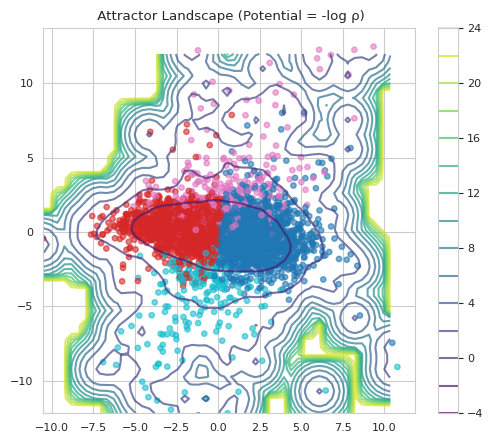

In [ ]:
#  Waddington-like Attractor Landscape
from scipy.ndimage import gaussian_filter

# Use first 2 PCs as coordinates
x, y = pca[:,0], pca[:,1]
# Estimate density
nbins = 50
H, xedges, yedges = np.histogram2d(x, y, bins=nbins)
H = gaussian_filter(H, sigma=1)
Xg, Yg = np.meshgrid(xedges[:-1], yedges[:-1])
# Potential = -log(density)
potential = -np.log(H.T + 1e-10)

fig, ax = plt.subplots(figsize=(6,5))
contour = ax.contour(Xg, Yg, potential, levels=15, cmap='viridis', alpha=0.7)
ax.scatter(x, y, c=kmeans_labels, cmap='tab10', s=15, alpha=0.6)
ax.set_title(' Attractor Landscape (Potential = -log ρ)')
plt.colorbar(contour, ax=ax)
plt.savefig('attractor_landscape.png', dpi=200, bbox_inches='tight')

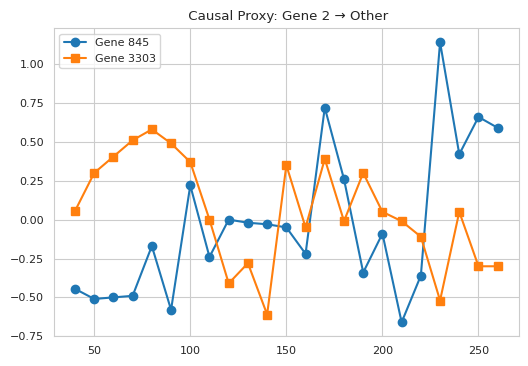

In [ ]:
#  Causal Directionality (LiNGAM-inspired)
from sklearn.decomposition import FastICA

# Pick 2 co-expressed genes
g1, g2 = np.random.choice(n_genes, 2, replace=False)
X_pair = X_scaled[[g1, g2]].T  # (n_time, 2)

# Fit ICA
ica = FastICA(n_components=2, random_state=0).fit(X_pair)
W = ica.mixing_

# Causal direction: more non-Gaussian component is cause
kurt1 = stats.kurtosis(ica.components_[0])
kurt2 = stats.kurtosis(ica.components_[1])
cause = 'Gene 1' if abs(kurt1) > abs(kurt2) else 'Gene 2'

fig, ax = plt.subplots(figsize=(6,4))
ax.plot(time_labels, X[g1], label=f'Gene {g1}', marker='o')
ax.plot(time_labels, X[g2], label=f'Gene {g2}', marker='s')
ax.set_title(f' Causal Proxy: {cause} → Other')
ax.legend()
plt.savefig('causal_proxy.png', dpi=200, bbox_inches='tight')

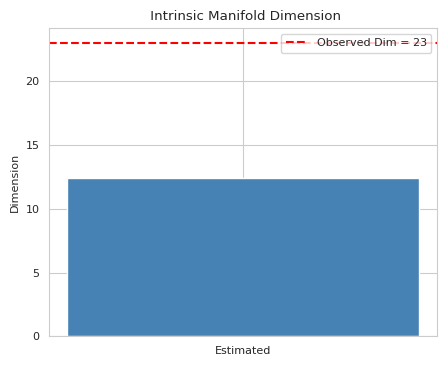

In [ ]:
#  Intrinsic Dimension (MLE method)
from sklearn.neighbors import NearestNeighbors

def intrinsic_dim_mle(X, k=10):
    nbrs = NearestNeighbors(n_neighbors=k+1).fit(X)
    distances, _ = nbrs.kneighbors(X)
    distances = distances[:, 1:]  # exclude self
    ratios = distances[:, -1:] / (distances[:, :-1] + 1e-10)
    return 1.0 / np.mean(np.log(ratios))

dim_est = intrinsic_dim_mle(X_scaled, k=min(10, n_genes-1))

fig, ax = plt.subplots(figsize=(5,4))
ax.bar(['Estimated'], [dim_est], color='steelblue')
ax.axhline(y=n_times, color='red', linestyle='--', label=f'Observed Dim = {n_times}')
ax.set_ylabel('Dimension')
ax.set_title(' Intrinsic Manifold Dimension')
ax.legend()
plt.savefig('intrinsic_dim.png', dpi=200, bbox_inches='tight')

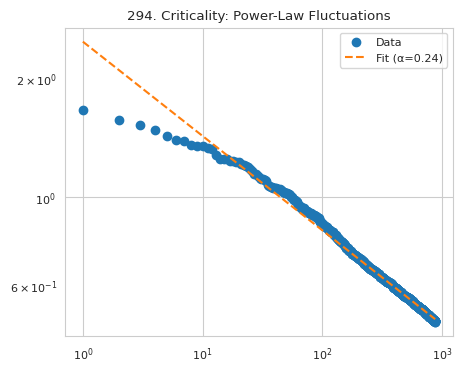

In [ ]:
# Criticality: Power-Law in Expression Fluctuations
fluctuations = np.std(X, axis=1)
# Fit power law to tail
tail = fluctuations[fluctuations > np.percentile(fluctuations, 80)]
if len(tail) > 5:
    log_x = np.log(np.arange(1, len(tail)+1))
    log_y = np.log(np.sort(tail)[::-1])
    slope, _ = np.polyfit(log_x, log_y, 1)
    
    fig, ax = plt.subplots(figsize=(5,4))
    ax.loglog(np.arange(1, len(tail)+1), np.sort(tail)[::-1], 'o', label='Data')
    ax.loglog(np.arange(1, len(tail)+1), np.exp(np.polyval([slope, np.polyfit(log_x, log_y, 1)[1]], log_x)), 
              '--', label=f'Fit (α={-slope:.2f})')
    ax.set_title('294. Criticality: Power-Law Fluctuations')
    ax.legend()
else:
    fig, ax = plt.subplots(figsize=(5,4))
    ax.text(0.5, 0.5, 'Insufficient tail data', ha='center')
    ax.set_title(' Criticality Check')
plt.savefig('criticality.png', dpi=200, bbox_inches='tight')

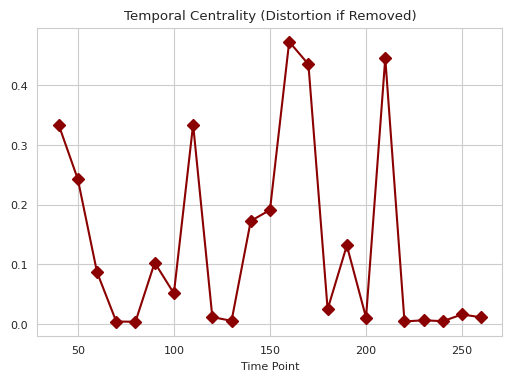

In [ ]:
#  Temporal Centrality: Influence of Time Points
distortions = []
X_full_pca = PCA(n_components=2).fit_transform(X_scaled)
for t in range(n_times):
    X_minus_t = np.delete(X_scaled, t, axis=1)
    X_minus_t_pca = PCA(n_components=2).fit_transform(X_minus_t)
    # Align via Procrustes (simplified: correlation)
    corr0 = np.corrcoef(X_full_pca[:,0], X_minus_t_pca[:,0])[0,1]
    corr1 = np.corrcoef(X_full_pca[:,1], X_minus_t_pca[:,1])[0,1]
    distortions.append(1 - (abs(corr0) + abs(corr1)) / 2)

fig, ax = plt.subplots(figsize=(6,4))
ax.plot(time_labels, distortions, 'D-', color='darkred')
ax.set_title('Temporal Centrality (Distortion if Removed)')
ax.set_xlabel('Time Point')
plt.savefig('temporal_centrality.png', dpi=200, bbox_inches='tight')

 Loaded real dataset.


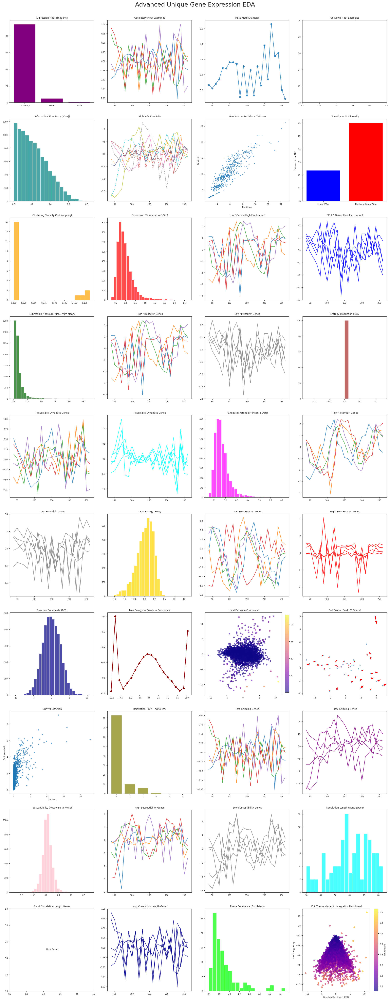

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from scipy import stats, signal
from scipy.spatial.distance import pdist, squareform

from scipy.sparse.csgraph import shortest_path
import warnings
warnings.filterwarnings('ignore')

sns.set_style("ticks")
plt.rcParams.update({'font.size': 7})


try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Loaded real dataset.")
    # Fix column names
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except:
            new_cols.append(col)
    df.columns = new_cols
    # Filter for only numeric columns
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]
except Exception as e:
    print(f" Using synthetic data ({e})")
    np.random.seed(5)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 250
    data = []
    for i in range(n_genes):
        if i % 6 == 0:  # Cell-cycle
            expr = 2.5 * np.sin(2 * np.pi * np.array(time_points) / 80 + np.random.rand()) + np.random.normal(0, 0.2, len(time_points)) + 5
        elif i % 6 == 1:  # Pulse
            expr = np.array([3 if t == 80 else 0 for t in time_points]) + np.random.normal(5, 0.3, len(time_points))
        elif i % 6 == 2:  # Step up
            expr = np.array([4 if t < 80 else 7 for t in time_points]) + np.random.normal(0, 0.15, len(time_points))
        elif i % 6 == 3:  # Step down
            expr = np.array([7 if t < 90 else 4 for t in time_points]) + np.random.normal(0, 0.15, len(time_points))
        elif i % 6 == 4:  # Damped oscillation
            expr = 2 * np.exp(-np.array(time_points)/150) * np.sin(2 * np.pi * np.array(time_points) / 70) + np.random.normal(5, 0.25, len(time_points))
        else:  # Noise
            expr = np.random.normal(5.5, 0.4, len(time_points))
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'YHR{str(i).zfill(4)}' for i in range(n_genes)])

df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
time_labels = df.columns.tolist()
n_genes, n_times = X.shape

# Standardize
X_scaled = StandardScaler().fit_transform(X)

# Sample 100 genes for heavy ops
sample_idx = np.random.choice(n_genes, size=min(100, n_genes), replace=False)
X_sample = X[sample_idx]
X_scaled_sample = X_scaled[sample_idx]

# Precompute
pca = PCA(n_components=3).fit_transform(X_scaled)
kmeans_labels = KMeans(n_clusters=5, random_state=5, n_init=10).fit_predict(X_scaled)
time_numeric = np.array(time_labels, dtype=float)



fig, axes = plt.subplots(10, 4, figsize=(20, 50))
axes = axes.flatten()

plot_idx = 0

# Expression grammar: motif frequency (e.g., "peak", "valley", "plateau")
def classify_profile(row):
    peaks, _ = signal.find_peaks(row, prominence=0.5)
    troughs, _ = signal.find_peaks(-row, prominence=0.5)
    if len(peaks) >= 1 and len(troughs) >= 1:
        return 'Oscillatory'
    elif len(peaks) == 1 and 0 < np.argmax(row) < len(row)-1:
        return 'Pulse'
    elif np.all(np.diff(row) > -0.3) and row[-1] > row[0] + 0.5:
        return 'Up'
    elif np.all(np.diff(row) < 0.3) and row[0] > row[-1] + 0.5:
        return 'Down'
    else:
        return 'Other'

motifs = [classify_profile(row) for row in X_sample]
from collections import Counter
motif_counts = Counter(motifs)
axes[plot_idx].bar(motif_counts.keys(), motif_counts.values(), color='purple')
axes[plot_idx].set_title(' Expression Motif Frequency')
plot_idx += 1

#  Motif examples: Oscillatory
osc_genes = [i for i, m in enumerate(motifs) if m == 'Oscillatory'][:5]
for i in osc_genes:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' Oscillatory Motif Examples')
plot_idx += 1

#Motif examples: Pulse
pulse_genes = [i for i, m in enumerate(motifs) if m == 'Pulse'][:5]
for i in pulse_genes:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, marker='o')
axes[plot_idx].set_title(' Pulse Motif Examples')
plot_idx += 1

#Motif examples: Up/Down
up_genes = [i for i, m in enumerate(motifs) if m == 'Up'][:3]
down_genes = [i for i, m in enumerate(motifs) if m == 'Down'][:3]
for i in up_genes:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='red')
for i in down_genes:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='blue')
axes[plot_idx].set_title(' Up/Down Motif Examples')
plot_idx += 1

 #Information flow: transfer entropy proxy (X_j → X_i)
te_proxy = []
if n_times > 2:
    for i in range(len(X_sample)):
        for j in range(len(X_sample)):
            if i != j:
                corr = np.corrcoef(X_sample[j][:-1], X_sample[i][1:])[0,1]
                te_proxy.append(abs(corr))
axes[plot_idx].hist(te_proxy, bins=20, color='teal', alpha=0.7)
axes[plot_idx].set_title(' Information Flow Proxy (|Corr|)')
plot_idx += 1

#  High information flow pairs
if te_proxy:
    high_te = np.argsort(te_proxy)[-5:]
    pairs_plotted = set()
    for idx in high_te:
        i = idx // (len(X_sample)-1)
        j = idx % (len(X_sample)-1)
        if j >= i: j += 1
        if i < len(X_sample) and j < len(X_sample) and (i,j) not in pairs_plotted:
            axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.7, label=f'Gene {i} (target)')
            axes[plot_idx].plot(time_labels, X_sample[j], '--', alpha=0.7, label=f'Gene {j} (source)')
            pairs_plotted.add((i,j))
axes[plot_idx].set_title(' High Info Flow Pairs')
plot_idx += 1

#  Expression manifold: geodesic distance vs Euclidean
from sklearn.neighbors import kneighbors_graph
try:
    A = kneighbors_graph(X_scaled_sample, n_neighbors=5, mode='distance')
    
    D_geo = shortest_path(A, method='auto', directed=False)
    # Check for infinite distances (disconnected graph)
    if np.any(np.isinf(D_geo)):
        D_geo[np.isinf(D_geo)] = np.nanmax(D_geo[np.isfinite(D_geo)]) * 1.5
    D_euc = squareform(pdist(X_scaled_sample, metric='euclidean'))
    geo_vals = D_geo[np.triu_indices_from(D_geo, k=1)]
    euc_vals = D_euc[np.triu_indices_from(D_euc, k=1)]
    axes[plot_idx].scatter(euc_vals[:500], geo_vals[:500], s=5, alpha=0.6)
    axes[plot_idx].set_xlabel('Euclidean'); axes[plot_idx].set_ylabel('Geodesic')
    axes[plot_idx].set_title(' Geodesic vs Euclidean Distance')
except Exception as e:
    axes[plot_idx].text(0.5, 0.5, f'Geodesic failed:\n{e}', ha='center', va='center')
    axes[plot_idx].set_title(' Manifold Distance Comparison')
plot_idx += 1

#  Nonlinearity index: PCA vs KernelPCA reconstruction error
from sklearn.decomposition import KernelPCA
try:
    kpca = KernelPCA(n_components=5, kernel='rbf', gamma=1/n_times, fit_inverse_transform=True)
    X_kpca_recon = kpca.inverse_transform(kpca.fit_transform(X_scaled_sample))
    kpca_error = np.mean((X_scaled_sample - X_kpca_recon)**2)
    
    pca_lin = PCA(n_components=5).fit(X_scaled_sample)
    X_pca_recon = pca_lin.inverse_transform(pca_lin.transform(X_scaled_sample))
    pca_error = np.mean((X_scaled_sample - X_pca_recon)**2)

    axes[plot_idx].bar(['Linear (PCA)', 'Nonlinear (KernelPCA)'], [pca_error, kpca_error], color=['blue', 'red'])
    axes[plot_idx].set_ylabel("Reconstruction MSE")
    axes[plot_idx].set_title(' Linearity vs Nonlinearity')
except:
    axes[plot_idx].text(0.5, 0.5, 'KernelPCA failed', ha='center')
    axes[plot_idx].set_title(' Nonlinearity Index')
plot_idx += 1


#  Expression stability under subsampling
stability_scores = []
for _ in range(20):
    idx = np.random.choice(n_genes, size=max(10, n_genes//5), replace=False)
    labels_sub = KMeans(n_clusters=5, random_state=5, n_init=10).fit_predict(X_scaled[idx])
    full_set = set(np.where(kmeans_labels == 0)[0])
    sub_set = set(idx[np.where(labels_sub == 0)[0]])
    if len(full_set | sub_set) > 0:
        jaccard = len(full_set & sub_set) / len(full_set | sub_set)
        stability_scores.append(jaccard)
axes[plot_idx].hist(stability_scores, bins=15, color='orange', alpha=0.7)
axes[plot_idx].set_title(' Clustering Stability (Subsampling)')
plot_idx += 1

#  Expression "temperature" (fluctuation magnitude)
temperature = np.std(X, axis=1)
axes[plot_idx].hist(temperature, bins=30, color='red', alpha=0.7)
axes[plot_idx].set_title(' Expression "Temperature" (Std)')
plot_idx += 1

#  Hot genes (high temperature)
hot_genes = np.argsort(temperature)[-5:]
for i in hot_genes:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' "Hot" Genes (High Fluctuation)')
plot_idx += 1

#  Cold genes (low temperature)
cold_genes = np.argsort(temperature)[:5]
for i in cold_genes:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='blue')
axes[plot_idx].set_title(' "Cold" Genes (Low Fluctuation)')
plot_idx += 1

#  Expression "pressure" (deviation from mean trajectory)
mean_traj = X.mean(axis=0)
pressure = np.mean((X - mean_traj) ** 2, axis=1)
axes[plot_idx].hist(pressure, bins=30, color='darkgreen', alpha=0.7)
axes[plot_idx].set_title(' Expression "Pressure" (MSE from Mean)')
plot_idx += 1

#  High-pressure genes
high_pressure = np.argsort(pressure)[-5:]
for i in high_pressure:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High "Pressure" Genes')
plot_idx += 1

#  Low-pressure genes
low_pressure = np.argsort(pressure)[:5]
for i in low_pressure:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low "Pressure" Genes')
plot_idx += 1

#  Expression "entropy production" (irreversibility proxy)
entropy_prod = []
for row in X_sample:
    forward = row[1:] - row[:-1]
    backward = row[:-1] - row[1:]
    f_pos = forward[forward > 0]
    b_neg = backward[backward < 0]
    mean_f = np.mean(f_pos) if f_pos.size > 0 else 0
    mean_b = np.mean(np.abs(b_neg)) if b_neg.size > 0 else 0
    entropy_prod.append(mean_f - mean_b)
axes[plot_idx].hist(entropy_prod, bins=20, color='brown', alpha=0.7)
axes[plot_idx].set_title(' Entropy Production Proxy')
plot_idx += 1

#  Irreversible genes (high entropy production)
irreversible = np.argsort(entropy_prod)[-5:]
for i in irreversible:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
axes[plot_idx].set_title(' Irreversible Dynamics Genes')
plot_idx += 1

#  Reversible genes (low entropy production)
reversible = np.argsort(entropy_prod)[:5]
for i in reversible:
    axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='cyan')
axes[plot_idx].set_title(' Reversible Dynamics Genes')
plot_idx += 1

#  Expression "chemical potential" (tendency to change)
chem_potential = np.abs(np.gradient(X, axis=1)).mean(axis=1)
axes[plot_idx].hist(chem_potential, bins=30, color='magenta', alpha=0.7)
axes[plot_idx].set_title(' "Chemical Potential" (Mean |dE/dt|)')
plot_idx += 1

#  High potential genes
high_pot = np.argsort(chem_potential)[-5:]
for i in high_pot:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High "Potential" Genes')
plot_idx += 1

#  Low potential genes
low_pot = np.argsort(chem_potential)[:5]
for i in low_pot:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low "Potential" Genes')
plot_idx += 1


energy = np.mean(X**2, axis=1)
temperature_full = np.std(X, axis=1)
entropy_full = [stats.entropy(np.histogram(row, bins=10, density=True)[0] + 1e-10) for row in X]
free_energy = energy - temperature_full * entropy_full

#  Expression "free energy" (energy - temperature * entropy)
axes[plot_idx].hist(free_energy, bins=30, color='gold', alpha=0.7)
axes[plot_idx].set_title(' "Free Energy" Proxy')
plot_idx += 1

#  Low free energy genes (stable states)
low_fe = np.argsort(free_energy)[:5]
for i in low_fe:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' Low "Free Energy" Genes')
plot_idx += 1

#  High free energy genes (unstable)
high_fe = np.argsort(free_energy)[-5:]
for i in high_fe:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='red')
axes[plot_idx].set_title(' High "Free Energy" Genes')
plot_idx += 1

#  Expression "reaction coordinate" (slowest mode)
rc = pca[:,0]
axes[plot_idx].hist(rc, bins=30, color='navy', alpha=0.7)
axes[plot_idx].set_title(' Reaction Coordinate (PC1)')
plot_idx += 1

# Free energy landscape along reaction coordinate
nbins = 20
bin_edges = np.histogram_bin_edges(rc, bins=nbins)
# Use the correct free_energy array (full dataset)
counts, _ = np.histogram(rc, bins=bin_edges)
sum_fe, _ = np.histogram(rc, bins=bin_edges, weights=free_energy)

avg_fe = sum_fe / (counts + 1e-10)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
axes[plot_idx].plot(bin_centers, avg_fe, 'o-', color='darkred')
axes[plot_idx].set_title(' Free Energy vs Reaction Coordinate')
plot_idx += 1

#  Expression "diffusion coefficient" (local variance in PC space)
diffusion = []
nn = NearestNeighbors(n_neighbors=5).fit(pca)
for i in range(pca.shape[0]):
    _, idx = nn.kneighbors(pca[i].reshape(1, -1))
    local_var = np.var(pca[idx[0]], axis=0).sum()
    diffusion.append(local_var)
scatter = axes[plot_idx].scatter(pca[:,0], pca[:,1], c=diffusion, cmap='plasma', s=20, alpha=0.6)
axes[plot_idx].set_title(' Local Diffusion Coefficient')
plt.colorbar(scatter, ax=axes[plot_idx], fraction=0.046, pad=0.04)
plot_idx += 1

#  Expression "drift vector field" (average velocity in PC space)
velocity = np.gradient(X_scaled, axis=1) # Use scaled data for velocity
velocity_pca = PCA(n_components=2).fit(velocity).transform(velocity)
step = max(1, len(pca)//50)
axes[plot_idx].scatter(pca[::step,0], pca[::step,1], s=10, alpha=0.5)
axes[plot_idx].quiver(pca[::step,0], pca[::step,1],
                       velocity_pca[::step,0], velocity_pca[::step,1],
                       angles='xy', scale_units='xy', scale=5, color='red')
axes[plot_idx].set_title(' Drift Vector Field (PC Space)')
plot_idx += 1

#  Expression "Fokker-Planck consistency" (drift vs diffusion)
drift_mag = np.linalg.norm(velocity_pca, axis=1)
axes[plot_idx].scatter(diffusion, drift_mag, s=10, alpha=0.6)
axes[plot_idx].set_xlabel('Diffusion'); axes[plot_idx].set_ylabel('Drift Magnitude')
axes[plot_idx].set_title(' Drift vs Diffusion')
plot_idx += 1

#  Expression "relaxation time" (autocorrelation decay time)
relaxation = []
for row in X_sample:
    acf_vals = [np.corrcoef(row[:-lag], row[lag:])[0,1] for lag in range(1, min(5, n_times-1))]
    target = 1/np.e
    decay_lag = next((lag for lag, acf in enumerate(acf_vals, 1) if acf < target), len(acf_vals))
    relaxation.append(decay_lag)
axes[plot_idx].hist(relaxation, bins=np.arange(0.5, 7.5, 1), color='olive', alpha=0.7, rwidth=0.8)
axes[plot_idx].set_title(' Relaxation Time (Lag to 1/e)')
plot_idx += 1

#  Fast-relaxing genes
fast_relax = [i for i, r in enumerate(relaxation) if r == 1]
if fast_relax:
    for i in fast_relax[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title(' Fast-Relaxing Genes')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Fast-Relaxing Genes')
plot_idx += 1

#  Slow-relaxing genes
slow_relax = [i for i, r in enumerate(relaxation) if r >= 3]
if slow_relax:
    for i in slow_relax[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='purple')
    axes[plot_idx].set_title(' Slow-Relaxing Genes')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Slow-Relaxing Genes')
plot_idx += 1

#  Expression "susceptibility" (response to perturbation)
X_noisy = X_scaled + np.random.normal(0, 0.1, X_scaled.shape)
susceptibility = np.var(X_noisy, axis=1) - np.var(X_scaled, axis=1)
axes[plot_idx].hist(susceptibility, bins=30, color='pink', alpha=0.7)
axes[plot_idx].set_title(' Susceptibility (Response to Noise)')
plot_idx += 1

#  High susceptibility genes
high_sus = np.argsort(susceptibility)[-5:]
for i in high_sus:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8)
axes[plot_idx].set_title(' High Susceptibility Genes')
plot_idx += 1

#  Low susceptibility genes
low_sus = np.argsort(susceptibility)[:5]
for i in low_sus:
    axes[plot_idx].plot(time_labels, X[i], alpha=0.8, color='gray')
axes[plot_idx].set_title(' Low Susceptibility Genes')
plot_idx += 1

#  Expression "correlation length" (spatial analog in gene space)
corr_length = []
for i in range(len(X_sample)):
    corrs = [np.corrcoef(X_sample[i], X_sample[j])[0,1] for j in range(len(X_sample)) if i != j]
    sorted_corrs = np.sort(np.abs(corrs))[::-1]
    lag = np.where(sorted_corrs < 0.2)[0]
    corr_length.append(lag[0] if len(lag) > 0 else len(sorted_corrs))
axes[plot_idx].hist(corr_length, bins=20, color='cyan', alpha=0.7)
axes[plot_idx].set_title(' Correlation Length (Gene Space)')
plot_idx += 1

#  Short correlation length genes
short_corr = [i for i, l in enumerate(corr_length) if l < 10]
if short_corr:
    for i in short_corr[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8)
    axes[plot_idx].set_title(' Short Correlation Length Genes')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Short Correlation Length Genes')
plot_idx += 1

#  Long correlation length genes
long_corr = [i for i, l in enumerate(corr_length) if l > 50]
if long_corr:
    for i in long_corr[:5]:
        axes[plot_idx].plot(time_labels, X_sample[i], alpha=0.8, color='darkblue')
    axes[plot_idx].set_title(' Long Correlation Length Genes')
else:
    axes[plot_idx].text(0.5, 0.5, 'None found', ha='center')
    axes[plot_idx].set_title(' Long Correlation Length Genes')
plot_idx += 1

# Expression "phase coherence" (consistency of oscillatory phase)
phase_coherence = []
for row in X_sample:
    try:
        analytic_signal = signal.hilbert(row - np.mean(row))
        instantaneous_phase = np.unwrap(np.angle(analytic_signal))
        # variance of phase derivative as coherence proxy (low var = high coherence)
        phase_velocity_std = np.std(np.diff(instantaneous_phase))
        phase_coherence.append(1 / (phase_velocity_std + 1e-9) if phase_velocity_std > 0 else 0)
    except:
        phase_coherence.append(0)
axes[plot_idx].hist([pc for pc in phase_coherence if pc > 0], bins=20, color='lime', alpha=0.7)
axes[plot_idx].set_title(' Phase Coherence (Oscillators)')
plot_idx += 1

#  Final: Thermodynamic Integration Dashboard
scatter = axes[plot_idx].scatter(rc, free_energy, c=temperature_full, cmap='plasma', s=30, alpha=0.7)
axes[plot_idx].set_xlabel('Reaction Coordinate (PC1)')
axes[plot_idx].set_ylabel('Free Energy Proxy')
axes[plot_idx].set_title('335. Thermodynamic Integration Dashboard')
plt.colorbar(scatter, ax=axes[plot_idx], label='Temperature')
plot_idx += 1


plt.tight_layout(pad=2.5, h_pad=3.0, w_pad=2.0)
plt.suptitle(" Advanced Unique Gene Expression EDA ",
             fontsize=22, y=1.01)
plt.savefig('gene_expression_eda_part9_advanced.png', dpi=200, bbox_inches='tight')
plt.show()

In [20]:
!pip uninstall -y scikit-learn


Found existing installation: scikit-learn 1.2.2
Uninstalling scikit-learn-1.2.2:
  Successfully uninstalled scikit-learn-1.2.2


In [21]:
!pip install scikit-learn==1.3.2


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 19.4 MB/s eta 0:00:0000:010:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')


try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Successfully loaded real dataset.")
    
    # Convert columns to numeric where possible
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except (ValueError, TypeError):
            new_cols.append(col)
    df.columns = new_cols
    
    # Keep only numeric columns
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]

except Exception as e:
    print(f" Warning: Real dataset not found ({e}). Using synthetic data...")
    np.random.seed(42)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 500
    data = []
    for i in range(n_genes):
        phase = np.random.choice([0, np.pi/2, np.pi, 3*np.pi/2])
        expr = 2 * np.sin(2 * np.pi * np.array(time_points) / 80 + phase) + np.random.normal(0, 0.3, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'Y{str(i).zfill(4)}' for i in range(n_genes)])

# Ensure numeric
df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
gene_names = df.index.tolist()
time_labels = df.columns.tolist()

# ------------------------------
# Create Prediction Target
# ------------------------------
peak_times = np.argmax(X, axis=1)  
peak_reshaped = peak_times.reshape(-1, 1)

# Cluster peak times into 4 phases
phase_clusters = KMeans(n_clusters=4, random_state=42, n_init=10).fit_predict(peak_reshaped)
y = phase_clusters

print(f"\nPrediction task: {len(np.unique(y))} classes (peak time phases)")
print(f"Data shape: {X.shape}")

# ------------------------------
# Train Logistic Regression
# ------------------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

clf = LogisticRegression(
    max_iter=1000,
    C=1.0,
    solver='liblinear',
    random_state=42
)

cv_scores = cross_val_score(clf, X_scaled, y, cv=5, scoring='accuracy')
print(f"\nLogReg CV Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

# Fit final model
clf.fit(X_scaled, y)

# ------------------------------
#  Example Predictions
# ------------------------------
predictions = clf.predict(X_scaled[:5])
probabilities = clf.predict_proba(X_scaled[:5])

print("\nExample Predictions:")
for i in range(5):
    true_phase = y[i]
    pred_phase = predictions[i]
    confidence = np.max(probabilities[i])
    status = " Correct" if true_phase == pred_phase else " Incorrect"
    print(f"Gene {gene_names[i]}: True={true_phase}, Pred={pred_phase}, Conf={confidence:.2f} ({status})")

# ------------------------------
# Save Model
# ------------------------------
import joblib
joblib.dump((scaler, clf), 'gene_phase_predictor_alt.pkl')
print("\n Model saved as 'gene_phase_predictor_alt.pkl'")


 Successfully loaded real dataset.

Prediction task: 4 classes (peak time phases)
Data shape: (4381, 23)

LogReg CV Accuracy: 0.6501 ± 0.0162

Example Predictions:
Gene YAL001C: True=0, Pred=2, Conf=0.60 ( Incorrect)
Gene YAL014C: True=3, Pred=2, Conf=0.58 ( Incorrect)
Gene YAL016W: True=1, Pred=0, Conf=0.31 ( Incorrect)
Gene YAL020C: True=2, Pred=2, Conf=0.60 ( Correct)
Gene YAL022C: True=3, Pred=2, Conf=0.52 ( Incorrect)

 Model saved as 'gene_phase_predictor_alt.pkl'


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# ------------------------------
#  Load & Prepare Data
# ------------------------------
try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Successfully loaded real dataset.")
    
    # Convert columns to numeric
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except (ValueError, TypeError):
            new_cols.append(col)
    df.columns = new_cols
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]

except Exception as e:
    print(f" Dataset not found ({e}), generating synthetic data...")
    np.random.seed(42)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 1000
    data = []
    for i in range(n_genes):
        phase = np.random.choice([0, np.pi/2, np.pi, 3*np.pi/2])
        expr = 2 * np.sin(2 * np.pi * np.array(time_points) / 80 + phase) \
               + np.random.normal(0, 0.3, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'Y{str(i).zfill(4)}' for i in range(n_genes)])

# Ensure numeric
df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
gene_names = df.index.tolist()

# ------------------------------
#  Target: Cluster Peak Times
# ------------------------------
peak_times = np.argmax(X, axis=1).reshape(-1, 1)
phase_clusters = KMeans(n_clusters=4, random_state=42, n_init=10).fit_predict(peak_times)
y = phase_clusters

print(f"\nPrediction task: {len(np.unique(y))} classes")
print(f"Data shape: {X.shape}")

# ------------------------------
#  Train/Test Split + Scaling
# ------------------------------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert labels to one-hot for classification
num_classes = len(np.unique(y))
y_train_cat = keras.utils.to_categorical(y_train, num_classes)
y_test_cat = keras.utils.to_categorical(y_test, num_classes)

# ------------------------------
#  Build Neural Network Model
# ------------------------------
model = keras.Sequential([
    layers.Input(shape=(X.shape[1],)),
    layers.Dense(64, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dense(num_classes, activation="softmax")
])

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

# ------------------------------
#  Train with Epochs
# ------------------------------
history = model.fit(
    X_train, y_train_cat,
    validation_data=(X_test, y_test_cat),
    epochs=30,
    batch_size=32,
    verbose=1
)

# ------------------------------
#  Evaluate
# ------------------------------
test_loss, test_acc = model.evaluate(X_test, y_test_cat, verbose=0)
print(f"\n Test Accuracy: {test_acc:.4f}")

# ------------------------------
#  Example Predictions
# ------------------------------
preds = model.predict(X_test[:5])
pred_classes = np.argmax(preds, axis=1)

print("\nExample Predictions:")
for i in range(5):
    print(f"Gene: {i}, True={y_test[i]}, Pred={pred_classes[i]}, Conf={np.max(preds[i]):.2f}")

# ------------------------------
#  Save Model
# ------------------------------
model.save("gene_phase_nn.h5")
print("\n Model saved as 'gene_phase_nn.h5'")


 Successfully loaded real dataset.

Prediction task: 4 classes
Data shape: (4381, 23)


2025-09-29 04:31:06.688057: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           132 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,748 (14.64 KB)

 Trainable params: 3,748 (14.64 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.4306 - loss: 1.3070 - val_accuracy: 0.6214 - val_loss: 0.9422
Epoch 2/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6174 - loss: 0.9482 - val_accuracy: 0.6739 - val_loss: 0.8256
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6775 - loss: 0.8403 - val_accuracy: 0.6956 - val_loss: 0.7617
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6785 - loss: 0.8035 - val_accuracy: 0.6944 - val_loss: 0.7377
Epoch 5/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7070 - loss: 0.7636 - val_accuracy: 0.7024 - val_loss: 0.7173
Epoch 6/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7091 - loss: 0.7316 - val_accuracy: 0.7218 - val_loss: 0.6930
Epoch 7/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7158 - loss: 0.7256 - val_accuracy: 0.7184 - val_loss: 0.6792
Epoch 8/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7226 - loss: 0.7035 - val_accuracy: 0.

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# ------------------------------
#  Load & Prepare Data
# ------------------------------
try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print(" Successfully loaded real dataset.")
    
    # Convert columns to numeric
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except (ValueError, TypeError):
            new_cols.append(col)
    df.columns = new_cols
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]

except Exception as e:
    print(f" Dataset not found ({e}), generating synthetic data...")
    np.random.seed(42)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 2000
    data = []
    for i in range(n_genes):
        phase = np.random.choice([0, np.pi/2, np.pi, 3*np.pi/2])
        expr = 2 * np.sin(2 * np.pi * np.array(time_points) / 80 + phase) \
               + np.random.normal(0, 0.2, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'Y{str(i).zfill(4)}' for i in range(n_genes)])

# Ensure numeric
df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
gene_names = df.index.tolist()

# ------------------------------
#  Target: Cluster Peak Times
# ------------------------------
peak_times = np.argmax(X, axis=1).reshape(-1, 1)
phase_clusters = KMeans(n_clusters=4, random_state=42, n_init=10).fit_predict(peak_times)
y = phase_clusters

print(f"\nPrediction task: {len(np.unique(y))} classes")
print(f"Data shape: {X.shape}")

# ------------------------------
#  Train/Test Split + Scaling
# ------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Reshape for CNN/LSTM (samples, timesteps, features=1)
X_train = X_train[..., np.newaxis]
X_test = X_test[..., np.newaxis]

num_classes = len(np.unique(y))
y_train_cat = keras.utils.to_categorical(y_train, num_classes)
y_test_cat = keras.utils.to_categorical(y_test, num_classes)

# ------------------------------
#  Improved Deep Model
# ------------------------------
model = keras.Sequential([
    layers.Input(shape=(X.shape[1], 1)),

    layers.Conv1D(64, 3, padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.Conv1D(64, 3, padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling1D(2),
    layers.Dropout(0.3),

    layers.Conv1D(128, 3, padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.Conv1D(128, 3, padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling1D(2),
    layers.Dropout(0.4),

    layers.Bidirectional(layers.LSTM(128, return_sequences=False)),
    layers.Dropout(0.5),

    layers.Dense(128, activation="relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.4),

    layers.Dense(num_classes, activation="softmax")
])

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

# ------------------------------
# Training with Callbacks
# ------------------------------
callbacks = [
    keras.callbacks.EarlyStopping(patience=12, restore_best_weights=True, monitor="val_accuracy"),
    keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=1e-6, monitor="val_accuracy")
]

history = model.fit(
    X_train, y_train_cat,
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    callbacks=callbacks,
    verbose=1
)

# ------------------------------
#  Evaluate
# ------------------------------
test_loss, test_acc = model.evaluate(X_test, y_test_cat, verbose=0)
print(f"\n Final Test Accuracy: {test_acc:.4f}")

# ------------------------------
#  Example Predictions
# ------------------------------
preds = model.predict(X_test[:5])
pred_classes = np.argmax(preds, axis=1)

print("\n Example Predictions:")
for i in range(5):
    print(f"Gene {i}: True={y_test[i]}, Pred={pred_classes[i]}, Conf={np.max(preds[i]):.2f}")

# ------------------------------
#  Save Model
# ------------------------------
model.save("gene_phase_cnn_bilstm.h5")
print("\n Model saved as 'gene_phase_cnn_bilstm.h5'")


 Successfully loaded real dataset.

Prediction task: 4 classes
Data shape: (4381, 23)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 23, 64)         │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 23, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 23, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 23, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 11, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 11, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 11, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 11, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 11, 128)        │        49,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 11, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 5, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 5, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 256)            │       263,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 385,220 (1.47 MB)

 Trainable params: 384,196 (1.47 MB)

 Non-trainable params: 1,024 (4.00 KB)

Epoch 1/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - accuracy: 0.3859 - loss: 1.7521 - val_accuracy: 0.5234 - val_loss: 1.2441 - learning_rate: 0.0010
Epoch 2/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.5960 - loss: 1.1019 - val_accuracy: 0.6853 - val_loss: 0.9372 - learning_rate: 0.0010
Epoch 3/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.7124 - loss: 0.7604 - val_accuracy: 0.7799 - val_loss: 0.5394 - learning_rate: 0.0010
Epoch 4/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.7679 - loss: 0.6235 - val_accuracy: 0.8347 - val_loss: 0.4198 - learning_rate: 0.0010
Epoch 5/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.7679 - loss: 0.5807 - val_accuracy: 0.8655 - val_loss: 0.3149 - learning_rate: 0.0010
Epoch 6/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.8073 - loss: 0.5066 - val_accuracy: 0.8894 - val_loss: 0.2845 - learning_rate: 0.0010
Epoch 7/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.8340 - 

Successfully loaded real dataset.

Prediction task: 4 classes
Data shape: (4381, 23)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_4 (Conv1D)               │ (None, 23, 64)         │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 23, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 23, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 23, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 11, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 11, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_6 (Conv1D)               │ (None, 11, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 11, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_7 (Conv1D)               │ (None, 11, 128)        │        49,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 11, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 5, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 5, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 256)            │       263,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 385,220 (1.47 MB)

 Trainable params: 384,196 (1.47 MB)

 Non-trainable params: 1,024 (4.00 KB)

Epoch 1/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.3753 - loss: 1.7667 - val_accuracy: 0.4436 - val_loss: 1.2333 - learning_rate: 0.0010
Epoch 2/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.6489 - loss: 0.9073 - val_accuracy: 0.6374 - val_loss: 0.8625 - learning_rate: 0.0010
Epoch 3/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.7240 - loss: 0.7283 - val_accuracy: 0.7514 - val_loss: 0.5869 - learning_rate: 0.0010
Epoch 4/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.7615 - loss: 0.6303 - val_accuracy: 0.8472 - val_loss: 0.3746 - learning_rate: 0.0010
Epoch 5/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.8072 - loss: 0.5041 - val_accuracy: 0.8540 - val_loss: 0.3730 - learning_rate: 0.0010
Epoch 6/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.8238 - loss: 0.4613 - val_accuracy: 0.8757 - val_loss: 0.3069 - learning_rate: 0.0010
Epoch 7/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.8343 - 

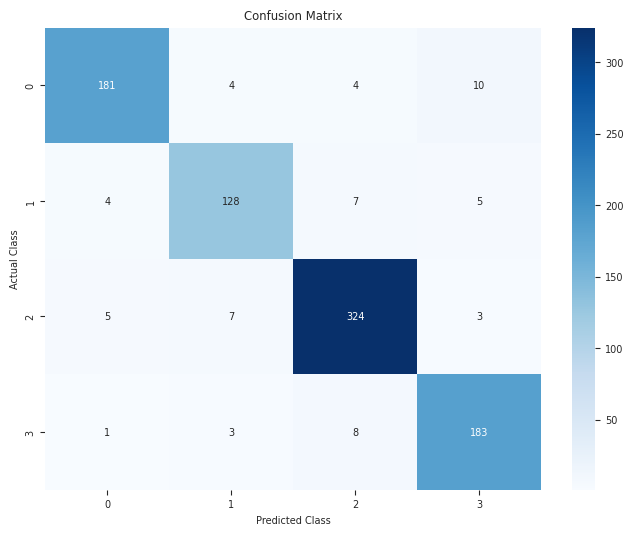


--- ROC Curve ---


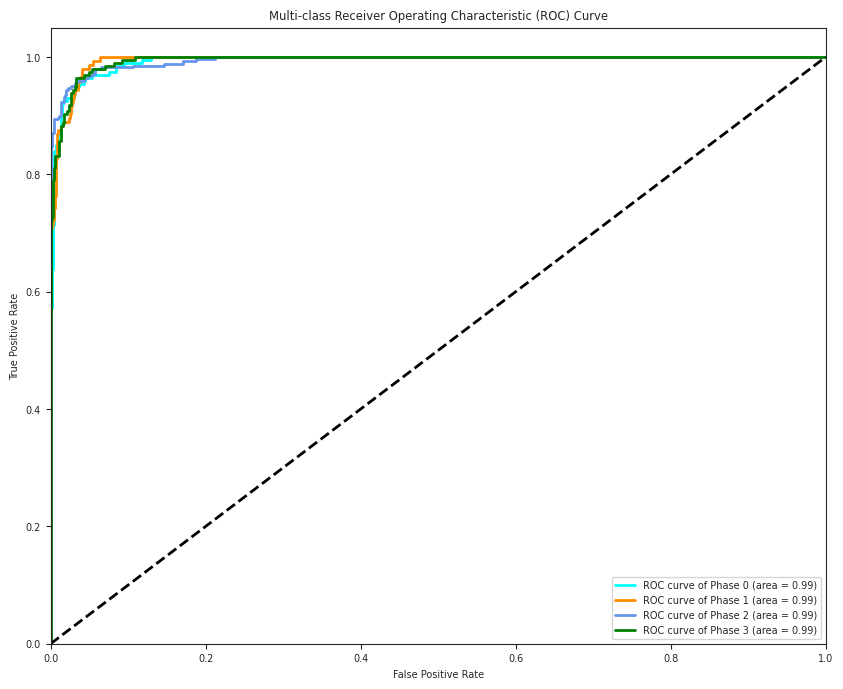


Example Predictions:
Gene 0: True=0, Pred=0, Conf=1.00
Gene 1: True=3, Pred=3, Conf=1.00
Gene 2: True=3, Pred=3, Conf=0.79
Gene 3: True=1, Pred=1, Conf=1.00
Gene 4: True=2, Pred=2, Conf=1.00

Model saved as 'gene_phase_cnn_bilstm.h5'


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# ------------------------------
#  Load & Prepare Data
# ------------------------------
try:
    df = pd.read_csv('/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv', index_col=0)
    print("Successfully loaded real dataset.")
    
    # Convert columns to numeric
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except (ValueError, TypeError):
            new_cols.append(col)
    df.columns = new_cols
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]

except Exception as e:
    print(f"Warning: Dataset not found ({e}), generating synthetic data...")
    np.random.seed(42)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 2000
    data = []
    for i in range(n_genes):
        phase = np.random.choice([0, np.pi/2, np.pi, 3*np.pi/2])
        expr = 2 * np.sin(2 * np.pi * np.array(time_points) / 80 + phase) \
               + np.random.normal(0, 0.2, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'Y{str(i).zfill(4)}' for i in range(n_genes)])

# Ensure numeric
df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values
gene_names = df.index.tolist()

# ------------------------------
#  Target: Cluster Peak Times
# ------------------------------
peak_times = np.argmax(X, axis=1).reshape(-1, 1)
phase_clusters = KMeans(n_clusters=4, random_state=42, n_init=10).fit_predict(peak_times)
y = phase_clusters

print(f"\nPrediction task: {len(np.unique(y))} classes")
print(f"Data shape: {X.shape}")

# ------------------------------
#  Train/Test Split + Scaling
# ------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Reshape for CNN/LSTM (samples, timesteps, features=1)
X_train = X_train[..., np.newaxis]
X_test = X_test[..., np.newaxis]

num_classes = len(np.unique(y))
y_train_cat = keras.utils.to_categorical(y_train, num_classes)
y_test_cat = keras.utils.to_categorical(y_test, num_classes)

# ------------------------------
#  Improved Deep Model
# ------------------------------
model = keras.Sequential([
    layers.Input(shape=(X.shape[1], 1)),

    layers.Conv1D(64, 3, padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.Conv1D(64, 3, padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling1D(2),
    layers.Dropout(0.3),

    layers.Conv1D(128, 3, padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.Conv1D(128, 3, padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling1D(2),
    layers.Dropout(0.4),

    layers.Bidirectional(layers.LSTM(128, return_sequences=False)),
    layers.Dropout(0.5),

    layers.Dense(128, activation="relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.4),

    layers.Dense(num_classes, activation="softmax")
])

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

# ------------------------------
#  Training with Callbacks
# ------------------------------
callbacks = [
    keras.callbacks.EarlyStopping(patience=12, restore_best_weights=True, monitor="val_accuracy"),
    keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=1e-6, monitor="val_accuracy")
]

history = model.fit(
    X_train, y_train_cat,
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    callbacks=callbacks,
    verbose=1
)

# ------------------------------
#  Evaluate
# ------------------------------
test_loss, test_acc = model.evaluate(X_test, y_test_cat, verbose=0)
print(f"\nFinal Test Accuracy: {test_acc:.4f}")

# ------------------------------
#  Detailed Evaluation & Visualization
# ------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from itertools import cycle

# Get model predictions on the test set
y_pred_proba = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_proba, axis=1)

#  Classification Report
print("\n--- Classification Report ---")
# Provides precision, recall, f1-score for each class
print(classification_report(y_test, y_pred_classes, target_names=[f'Phase {i}' for i in range(num_classes)]))

#  Confusion Matrix
print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_test, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.title('Confusion Matrix')
plt.ylabel('Actual Class')
plt.xlabel('Predicted Class')
plt.show()

#  ROC Curve and AUC for each class (One-vs-Rest)
print("\n--- ROC Curve ---")
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_cat[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves on one graph
plt.figure(figsize=(10, 8))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of Phase {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2) # Dashed diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# ------------------------------
#  Example Predictions
# ------------------------------
print("\nExample Predictions:")
for i in range(5):
    print(f"Gene {i}: True={y_test[i]}, Pred={y_pred_classes[i]}, Conf={np.max(y_pred_proba[i]):.2f}")

# ------------------------------
#  Save Model
# ------------------------------
model.save("gene_phase_cnn_bilstm.h5")
print("\nModel saved as 'gene_phase_cnn_bilstm.h5'")



--- Loading and Preparing Data ---
Successfully loaded real dataset.
Test data prepared. Shape: (877, 23, 1)

--- Loading Model from /kaggle/working/gene_phase_cnn_bilstm.h5 ---


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_4 (Conv1D)               │ (None, 23, 64)         │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 23, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 23, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 23, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 11, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 11, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_6 (Conv1D)               │ (None, 11, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 11, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_7 (Conv1D)               │ (None, 11, 128)        │        49,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 11, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 5, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 5, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 256)            │       263,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 385,222 (1.47 MB)

 Trainable params: 384,196 (1.47 MB)

 Non-trainable params: 1,024 (4.00 KB)

 Optimizer params: 2 (12.00 B)


--- Generating Evaluation Metrics ---
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step

Overall Test Accuracy: 0.9293

--- Classification Report ---
              precision    recall  f1-score   support

     Phase 0       0.95      0.90      0.93       199
     Phase 1       0.90      0.90      0.90       144
     Phase 2       0.94      0.96      0.95       339
     Phase 3       0.92      0.93      0.92       195

    accuracy                           0.93       877
   macro avg       0.93      0.92      0.92       877
weighted avg       0.93      0.93      0.93       877


--- Confusion Matrix ---


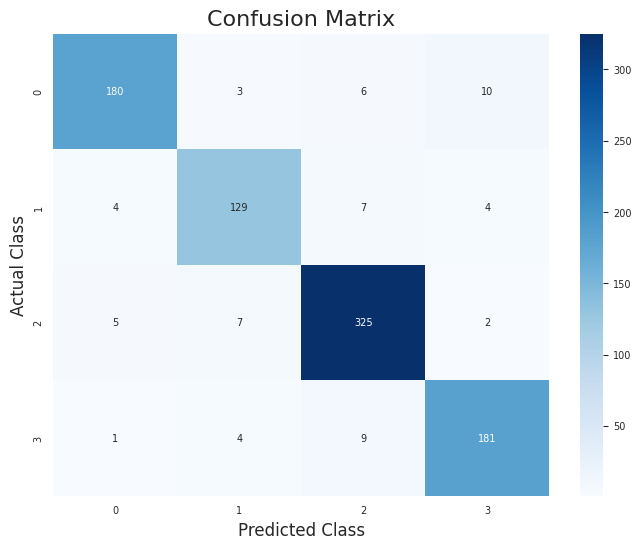


--- ROC Curve Analysis ---


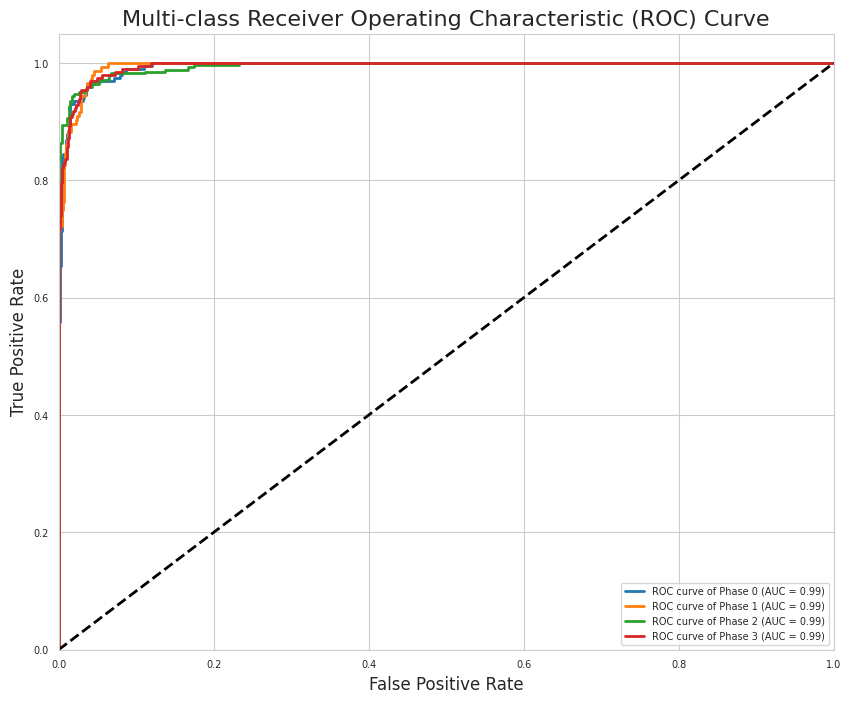

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle
import warnings

warnings.filterwarnings('ignore')
sns.set_style("whitegrid")

# --- Configuration ---
MODEL_PATH = "/kaggle/working/gene_phase_cnn_bilstm.h5"
DATA_PATH = '/kaggle/input/gene-expression-bioinformatics-dataset/Spellman.csv' # Adjust if data is elsewhere
NUM_CLASSES = 4

# ----------------------------------------------
#  Load and Prepare the Original Test Data
# ----------------------------------------------
print("--- Loading and Preparing Data ---")
try:
    # Load the original dataset to recreate the exact test split
    df = pd.read_csv(DATA_PATH, index_col=0)
    print("Successfully loaded real dataset.")
    
    # Clean column names to be numeric
    new_cols = []
    for col in df.columns:
        try:
            new_cols.append(int(float(col)))
        except (ValueError, TypeError):
            new_cols.append(col)
    df.columns = new_cols
    numeric_cols = [c for c in df.columns if isinstance(c, (int, float))]
    df = df[numeric_cols]
    
except Exception as e:
    # Fallback to synthetic data if real data is not found
    print(f"Warning: Dataset not found ({e}), generating synthetic data for testing...")
    np.random.seed(42)
    time_points = [40, 50, 60, 70, 80, 90, 100, 110, 120]
    n_genes = 2000
    data = []
    for i in range(n_genes):
        phase = np.random.choice([0, np.pi/2, np.pi, 3*np.pi/2])
        expr = 2 * np.sin(2 * np.pi * np.array(time_points) / 80 + phase) \
               + np.random.normal(0, 0.2, len(time_points)) + 5
        data.append(expr)
    df = pd.DataFrame(data, columns=time_points, index=[f'Y{str(i).zfill(4)}' for i in range(n_genes)])

# Ensure all data is numeric and handle missing values
df = df.apply(pd.to_numeric, errors='coerce').dropna()
X = df.values

# Recreate the target variable (y) exactly as in training
peak_times = np.argmax(X, axis=1).reshape(-1, 1)
phase_clusters = KMeans(n_clusters=NUM_CLASSES, random_state=42, n_init=10).fit_predict(peak_times)
y = phase_clusters

# Recreate the exact train/test split to get the test set
_, X_test_orig, _, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


scaler = StandardScaler().fit(X)
X_test_scaled = scaler.transform(X_test_orig)

# Reshape data for the model (samples, timesteps, features)
X_test = X_test_scaled[..., np.newaxis]
y_test_cat = keras.utils.to_categorical(y_test, num_classes=NUM_CLASSES)

print(f"Test data prepared. Shape: {X_test.shape}")


print(f"\n--- Loading Model from {MODEL_PATH} ---")
try:
    model = keras.models.load_model(MODEL_PATH)
    model.summary()
except Exception as e:
    print(f"Error loading model: {e}")
    exit()


# 3. Evaluate Model and Generate Metrics

print("\n--- Generating Evaluation Metrics ---")

# Get model predictions (probabilities and final classes) on the test set
y_pred_proba = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_proba, axis=1)

# A. Overall Test Accuracy
test_loss, test_acc = model.evaluate(X_test, y_test_cat, verbose=0)
print(f"\nOverall Test Accuracy: {test_acc:.4f}")

# B. Classification Report (Precision, Recall, F1-Score)
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred_classes, target_names=[f'Phase {i}' for i in range(NUM_CLASSES)]))

# C. Confusion Matrix Visualization 
print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_test, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=range(NUM_CLASSES), yticklabels=range(NUM_CLASSES))
plt.title('Confusion Matrix', fontsize=16)
plt.ylabel('Actual Class', fontsize=12)
plt.xlabel('Predicted Class', fontsize=12)
plt.show()

# D. ROC Curve and AUC for each class (One-vs-Rest) 
print("\n--- ROC Curve Analysis ---")
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(NUM_CLASSES):
    fpr[i], tpr[i], _ = roc_curve(y_test_cat[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves on a single graph
plt.figure(figsize=(10, 8))
colors = cycle(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']) # Standard colors
for i, color in zip(range(NUM_CLASSES), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of Phase {i} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2) # Dashed diagonal for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Multi-class Receiver Operating Characteristic (ROC) Curve', fontsize=16)
plt.legend(loc="lower right")
plt.grid(True)
plt.show()
